In [1]:
#libraries necessary to run the code:

library(data.table)
library(ggplot2)
library(dplyr)
library(tidyr)
library(spectral) #for power spectral density
library(ggfortify) #for diagnostic plots of linear regression
library(patchwork) #for combining plots together 
library(gridExtra) #for combining ggplots together
library(scales) #for ggplots

#for creating latex tables
library(xtable)
library(knitr)

library(zoo) #to calculate the rolling average



Attaching package: ‘dplyr’

The following objects are masked from ‘package:data.table’:

    between, first, last

The following objects are masked from ‘package:stats’:

    filter, lag

The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union

Loading required package: rasterImage
Loading required package: plotrix
Loading required package: lattice
Loading required package: RhpcBLASctl
Loading required package: pbapply
Detecting 4 cores

Attaching package: ‘gridExtra’

The following object is masked from ‘package:dplyr’:

    combine


Attaching package: ‘scales’

The following object is masked from ‘package:plotrix’:

    rescale


Attaching package: ‘zoo’

The following objects are masked from ‘package:data.table’:

    yearmon, yearqtr

The following objects are masked from ‘package:base’:

    as.Date, as.Date.numeric



In [2]:
#set the language of dates to english
Sys.setlocale("LC_TIME", "C")


[1] "C"

# Importing, cleaning, preparing the sequence data 2022-23

In [3]:
#import data
dtAmplicons = fread("Data/amplicons_coveragesV41.csv")
dtTime <- fread("Data/timeline.tsv")

#change the names - the first row contains the number of each amplicon (from 0 to 95)
NewNames = unlist(dtAmplicons[1,])
setnames(dtAmplicons, NewNames)
dtAmplicons = dtAmplicons[-1,] #erase the first row containing the numbers

#merge both tables
dt <- merge(dtAmplicons, dtTime, by = "sample")

#rename amplicons (number as a name might cause problems later): We will name them X0 to X95.
number_variables <- dt[,2:97]
old_names <- names(number_variables)
new_names <- paste0("X", old_names)
names(dt)[2:97] <- new_names

#we have 3 outliers in october: let us erase them. This also erases the rows with date = NA. There are no more NAs in the dataset.
dt = dt[!(date >= '2023-10-02')]

#the start and end dates of our data
print(paste(min(dt[,date]), "is the start date of our data"))
print(paste(max(dt[,date]), "is the last date of our data"))

#locations: we will only keep data from locations that have data from the entire time period. We will not analyse the other ones. 
dt = dt[!(location %in% c('Neuchâtel (NE)', 'Schwyz (SZ)', 'Kanton Zürich', '', 'Basel (BS)', 'Lausanne (VD)', 'Porrentruy (JU)'))]

#Erase variables that we won't need (reads and proto are all the same for the chosen locations)
dt <- dt[, c('proto', 'reads', 'sample', 'batch', 'location_code') := NULL]

#We have some duplicate rows: let us erase the duplicates
dt <- dt %>% distinct(date, location, .keep_all = TRUE)

#Transform all the amplicon variables to one variable called amplicon.
dt <- tidyr::pivot_longer(dt, cols = starts_with("X"), names_to = "amplicon", values_to = "depth")

#Converting the names of amplicons into ordered factors
dt$amplicon <- factor(dt$amplicon, levels = paste0("X", 0:95))

#_________________________________________________________________________________________________________
# Our data set now contains 4 variables: Date, location, amplicon, depth
#_________________________________________________________________________________________________________

summary(dt)
head(dt)

[1] "2022-05-11 is the start date of our data"
[1] "2023-06-21 is the last date of our data"


      date              location            amplicon          depth        
 Min.   :2022-05-11   Length:231648      X0     :  2413   Min.   :      0  
 1st Qu.:2022-08-20   Class :character   X1     :  2413   1st Qu.:    363  
 Median :2022-11-29   Mode  :character   X2     :  2413   Median :   6644  
 Mean   :2022-11-29                      X3     :  2413   Mean   :  49268  
 3rd Qu.:2023-03-11                      X4     :  2413   3rd Qu.:  44249  
 Max.   :2023-06-20                      X5     :  2413   Max.   :3101483  
                                         (Other):217170                    

date,location,amplicon,depth
2022-07-13,Lugano (TI),X0,133.0
2022-07-13,Lugano (TI),X1,139679.5
2022-07-13,Lugano (TI),X2,31130.0
2022-07-13,Lugano (TI),X3,11404.5
2022-07-13,Lugano (TI),X4,2312.0
2022-07-13,Lugano (TI),X5,7975.5


### Calculating the delay

In [4]:
tuesdaywwtps = c("Genève (GE)", "Lugano (TI)",  "Zürich (ZH)") #testing regime 1
wednesdaywwtps = c("Chur (GR)", "Laupen (BE)", "Altenrhein (SG)") #testing regime 2

dt <- dt %>% mutate(sample_day = lubridate::wday(dt$date, week_start=1)) %>%
                    mutate(test_day = ifelse(location %in% tuesdaywwtps,2,3)) %>%
                    mutate(delay = case_when(
                        sample_day %in% c(1,2) ~ 4 - sample_day,       #if the sample is taken on Mo or Tue, then it's tested on Thursday, not matter the location
                        test_day == 2 & sample_day >= 3 ~ 7-sample_day + 2,  #the location is tested on tuesdays and the sample is from We to Su
                        test_day == 3 & sample_day >= 3 ~ 7-sample_day + 3
                    ))

head(dt)

date,location,amplicon,depth,sample_day,test_day,delay
2022-07-13,Lugano (TI),X0,133.0,3,2,6
2022-07-13,Lugano (TI),X1,139679.5,3,2,6
2022-07-13,Lugano (TI),X2,31130.0,3,2,6
2022-07-13,Lugano (TI),X3,11404.5,3,2,6
2022-07-13,Lugano (TI),X4,2312.0,3,2,6
2022-07-13,Lugano (TI),X5,7975.5,3,2,6


Warning message:
“Removed 1152 rows containing missing values or values outside the scale range (`geom_tile()`).”Warning message:
“Removed 1152 rows containing missing values or values outside the scale range (`geom_tile()`).”

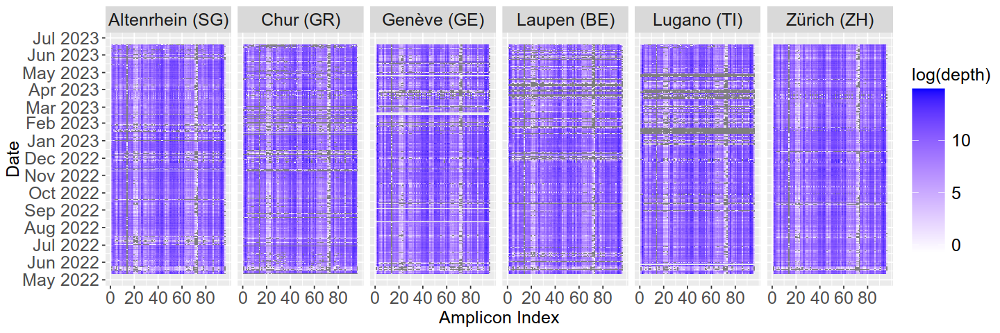

In [5]:
#plotting the raw read depths data

dt <- dt %>%
    mutate(amplicon = factor(amplicon, levels = unique(amplicon)))
# Get the number of unique amplicons
n_amplicons <- length(unique(dt$amplicon))

# Plotting the data
number = 15
options(repr.plot.width = 12, repr.plot.height = 4)
dt%>%
    ggplot(aes(as.numeric(amplicon), date)) +
    geom_tile(aes(fill = log(depth))) + facet_wrap(~location, ncol=6)+
    scale_fill_gradient(low = "white", high = "blue") +
    scale_y_date(breaks = date_breaks("1 month"), labels = date_format("%b %Y"), limits = c(min(dt$date), max(dt$date))) +   
    scale_x_continuous(breaks = seq(0, n_amplicons, by = 20), 
                       labels = seq(0, n_amplicons, by = 20)) +
    theme(axis.text.x = element_text(size = number), axis.text.y = element_text(size = number), 
                  axis.title.x = element_text(size = number), axis.title.y = element_text(size = number),strip.text = element_text(size = number),
          legend.text = element_text(size = number),
         legend.title = element_text(size=number),legend.key.size = unit(1, "cm"), legend.key.height = unit(1, "cm"),legend.key.width = unit(1, "cm")) +
                  xlab("Date") + ylab("Entropy") +
    labs(y = "Date" ) +labs(x = "Amplicon Index")


ggsave("visualisation.eps", path="FinalReport/figures",, width = 12, height = 4)


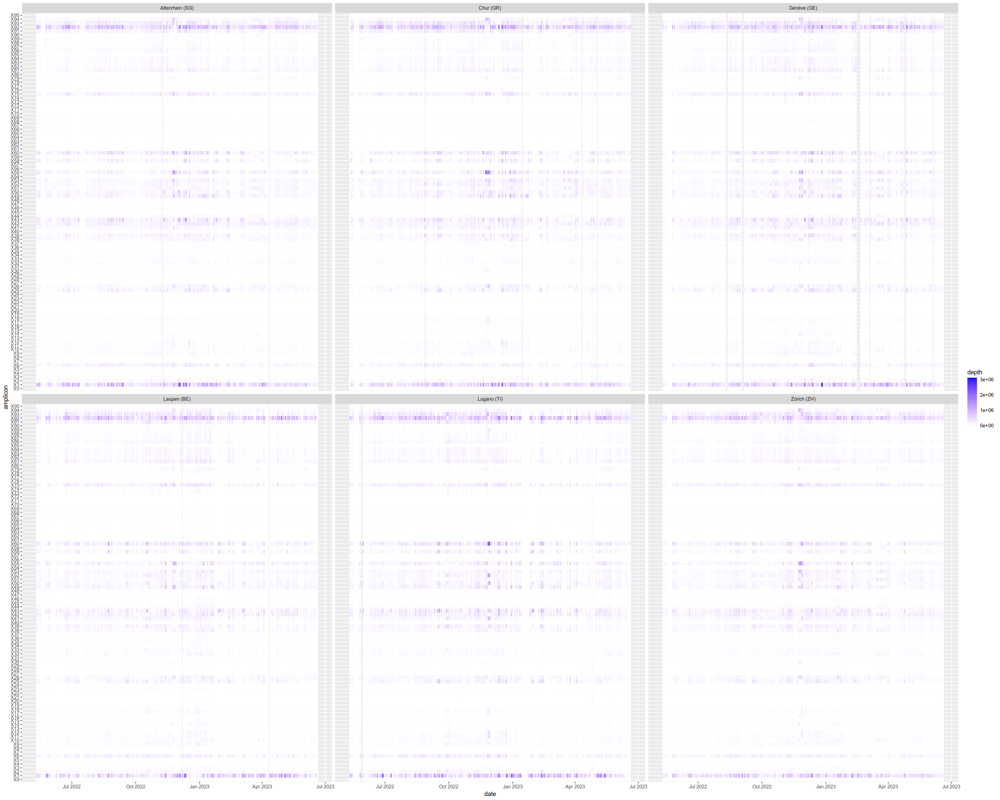

In [6]:
#plotting the raw read depths data for all locations
options(repr.plot.width=25, repr.plot.height=20)
dt %>%  
    ggplot(aes(date, amplicon)) + geom_tile(aes(fill = depth)) + scale_fill_gradient(low = "white", high = "blue")+ facet_wrap(~location)


# Exploratory analysis

### Entropy

In [7]:
#normalizing by the sum of the read depths per day and per location
sum_normalization <- dt %>%
    group_by(location, date) %>%   
    mutate(sum = sum(depth)) %>%  #for each day and location, we calculate the the sum of the depths over all amplicons
    mutate(sum_norm = (depth/sum)) %>%
    mutate(sum_norm = replace_na(sum_norm, 0))  #because of days where all the reads are 0, there is division by 0 -> we replace the created NANs with 0.
#------------------------------------------------------
#calculating entropy with this normalization: version where we only keep location, date and entropy in order to calculate spectral density. 
sum_entropy_psd <- sum_normalization %>%   
    mutate(product = -(sum_norm * log(sum_norm))) %>%
    mutate(product = replace_na(product, 0)) %>%
    group_by(location, date) %>%
    summarize(entropy = sum(product))
head(sum_entropy_psd)
#-------------------------------------------------------
#define a new data table with entropy so that we can merge it with concentrations and keep the delay.
sum_entropy<- sum_normalization %>%   
    mutate(product = -(sum_norm * log(sum_norm))) %>%
    mutate(product = replace_na(product, 0)) %>%
    group_by(location, date) %>%
    mutate(entropy = sum(product))
head(sum_entropy)

`summarise()` has grouped output by 'location'. You can override using the `.groups` argument.

location,date,entropy
Altenrhein (SG),2022-05-11,3.205873
Altenrhein (SG),2022-05-12,3.446567
Altenrhein (SG),2022-05-13,3.540270
Altenrhein (SG),2022-05-14,2.605609
Altenrhein (SG),2022-05-15,3.039682
Altenrhein (SG),2022-05-16,3.721499


date,location,amplicon,depth,sample_day,test_day,delay,sum,sum_norm,product,entropy
2022-07-13,Lugano (TI),X0,133.0,3,2,6,2399826,5.542068e-05,0.0005431536,3.916684
2022-07-13,Lugano (TI),X1,139679.5,3,2,6,2399826,5.820401e-02,0.1655206261,3.916684
2022-07-13,Lugano (TI),X2,31130.0,3,2,6,2399826,1.297177e-02,0.0563620916,3.916684
2022-07-13,Lugano (TI),X3,11404.5,3,2,6,2399826,4.752220e-03,0.0254203042,3.916684
2022-07-13,Lugano (TI),X4,2312.0,3,2,6,2399826,9.634032e-04,0.0066908722,3.916684
2022-07-13,Lugano (TI),X5,7975.5,3,2,6,2399826,3.323366e-03,0.0189657089,3.916684


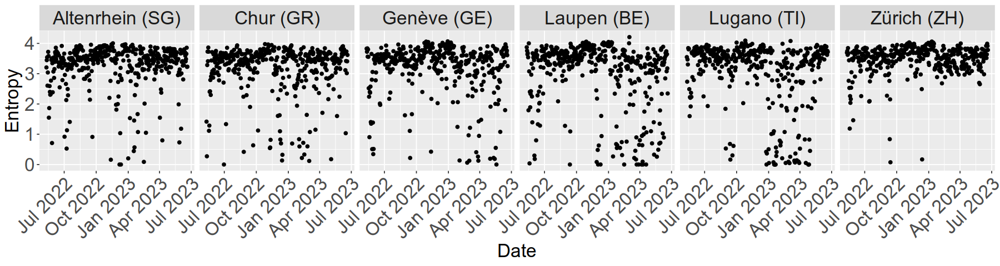

In [8]:
#visualisation of the entropy for all locations

#count the number of different locations
num_locations <- length(unique(sum_entropy$location))

options(repr.plot.width=15, repr.plot.height=4)

#letter size
number = 20

entropy_plot <- sum_entropy_psd %>%  ggplot(aes(date, entropy)) + geom_point() + facet_wrap(~location, ncol = num_locations) + 
                    theme(axis.text.x = element_text(angle = 45, hjust = 1, size = number), axis.text.y = element_text(size = number), 
                  axis.title.x = element_text(size = number), axis.title.y = element_text(size = number),strip.text = element_text(size = number)) +
                  xlab("Date") + ylab("Entropy")
print(entropy_plot)
ggsave("entropy.eps", path="FinalReport/figures", width = 16, height = 6)



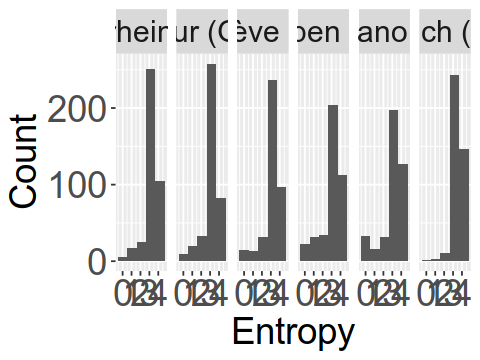

In [9]:
#frequency of the entropy values
#remark: the .eps has correct dimensions as opposed to the plot in this jupyter notebook
options(repr.plot.width=4, repr.plot.height=3)
number = 18

ggplot(sum_entropy_psd, aes(x = entropy)) +
  geom_histogram(bins = 5) + 
  facet_wrap(~location, ncol=6) + 
  theme(axis.text.x = element_text(size = 22), axis.text.y = element_text(size = 22), 
          axis.title.x = element_text(size = 22), axis.title.y = element_text(size = 22),strip.text = element_text(size = number)) +
  xlab("Entropy") + ylab("Count")
ggsave("hist_entropy.eps", path="FinalReport/figures", width=12, height = 4)


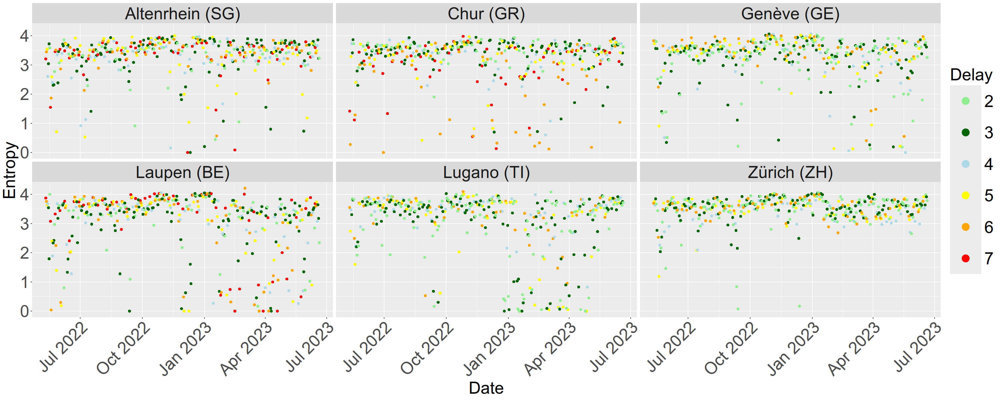

In [10]:
#plot of entropy with colored delays
options(repr.plot.width=25, repr.plot.height=10)
custom_colors <- c("2" = "lightgreen", "3" = "darkgreen" , "4" = "lightblue", "5" = "yellow" , "6"= "orange", "7" = "red")
sum_entropy %>%  
    ggplot(aes(date, entropy, color = factor(delay))) + geom_point() + facet_wrap(~location) + 
    scale_color_manual(name = "Delay", values = custom_colors) + labs(x="Date", y= "Entropy") +
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 30), axis.text.y = element_text(size = 30), 
          axis.title.x = element_text(size = 30), axis.title.y = element_text(size = 30),strip.text = element_text(size = 30), legend.text = element_text(size = 30),
         legend.title = element_text(size=30), legend.key.size = unit(2.5, "cm"), legend.key.height = unit(2, "cm"),legend.key.width = unit(2, "cm") ) +
     guides(color = guide_legend(override.aes = list(size = 6))) 

ggsave("entropy_delay_colors.eps", path="FinalReport/figures", width = 25, height=15)


In [11]:
#distribution of different delay classes

#define data that only keep the X0 amplicon in order to not repeat the delays and entropy 96 times for one day
sum_entropy_distinct <- sum_entropy %>% distinct(date, location, .keep_all = TRUE)

for (loc in unique(sum_entropy_distinct$location)){
    rep <- sum_entropy_distinct %>% filter(location == loc)
    print(paste("This is the distribution of delays for ", loc))
    print(table(rep$delay))
}

[1] "This is the distribution of delays for  Lugano (TI)"

  2   3   4   5   6 
115 115  58  58  58 
[1] "This is the distribution of delays for  Zürich (ZH)"

  2   3   4   5   6 
116 116  58  58  58 
[1] "This is the distribution of delays for  Genève (GE)"

  2   3   4   5   6 
112 113  56  56  56 
[1] "This is the distribution of delays for  Chur (GR)"

  2   3   4   5   6   7 
 57 114  58  58  58  57 
[1] "This is the distribution of delays for  Altenrhein (SG)"

  2   3   4   5   6   7 
 57 116  58  58  58  57 
[1] "This is the distribution of delays for  Laupen (BE)"

  2   3   4   5   6   7 
 57 116  58  58  58  57 


In [12]:
#Create a latex table of the delay frequencies



locations <- unique(sum_entropy$location)
delays <- 2:7
table_data <- data.frame(Location = locations)

for (delay in delays) {
  table_data[[as.character(delay)]] <- sapply(locations, function(loc) {
    sum(sum_entropy_distinct$delay[sum_entropy_distinct$location == loc] == delay)
  })
}

# Convert the data frame to a LaTeX table
latex_table <- xtable(table_data)

# Print the LaTeX table with booktabs style
print(latex_table, include.rownames = FALSE, booktabs = TRUE)


% latex table generated in R 3.6.1 by xtable 1.8-4 package
% Mon Aug 12 12:34:26 2024
\begin{table}[ht]
\centering
\begin{tabular}{lrrrrrr}
  \toprule
Location & 2 & 3 & 4 & 5 & 6 & 7 \\ 
  \midrule
Lugano (TI) & 115 & 115 &  58 &  58 &  58 &   0 \\ 
  Zürich (ZH) & 116 & 116 &  58 &  58 &  58 &   0 \\ 
  Genève (GE) & 112 & 113 &  56 &  56 &  56 &   0 \\ 
  Chur (GR) &  57 & 114 &  58 &  58 &  58 &  57 \\ 
  Altenrhein (SG) &  57 & 116 &  58 &  58 &  58 &  57 \\ 
  Laupen (BE) &  57 & 116 &  58 &  58 &  58 &  57 \\ 
   \bottomrule
\end{tabular}
\end{table}


### Coverage

In [13]:
#definition of coverage dataframes with different thresholds
coverage_threshold100 <- dt %>% mutate(depth = ifelse(depth <=100,0,depth)) %>% group_by(location, date) %>% 
                            summarize(coverage = sum(depth != 0)/96)

coverage_threshold200 <- dt %>% mutate(depth = ifelse(depth <=200,0,depth)) %>% group_by(location, date) %>% 
                            summarize(coverage = sum(depth != 0)/96)

coverage_threshold1000 <- dt %>% mutate(depth = ifelse(depth <=1000,0,depth)) %>% group_by(location, date) %>% 
                            summarize(coverage = sum(depth != 0)/96)


`summarise()` has grouped output by 'location'. You can override using the `.groups` argument.`summarise()` has grouped output by 'location'. You can override using the `.groups` argument.`summarise()` has grouped output by 'location'. You can override using the `.groups` argument.

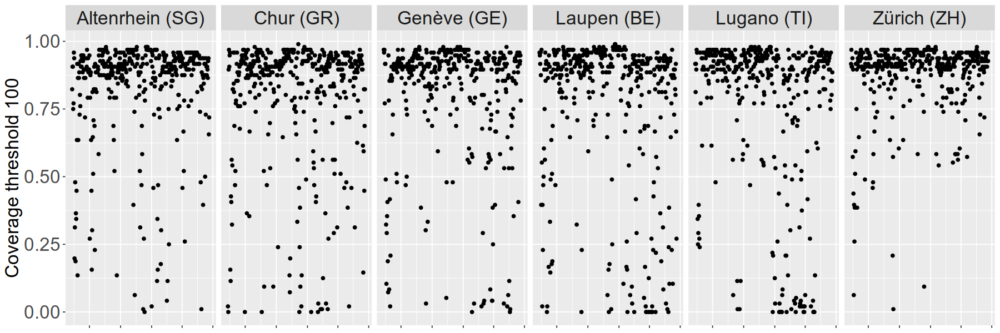

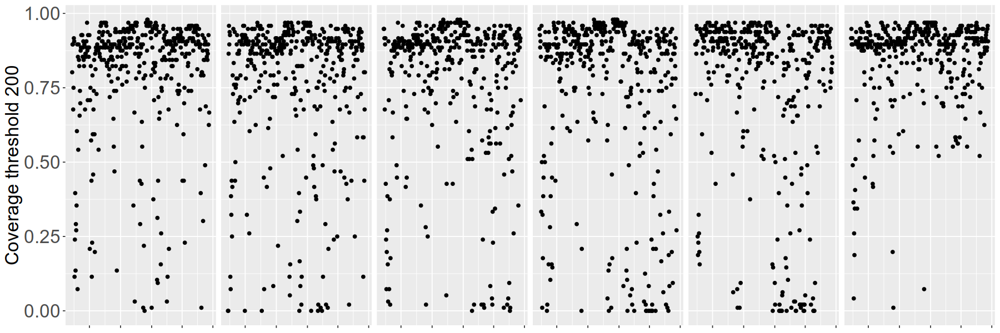

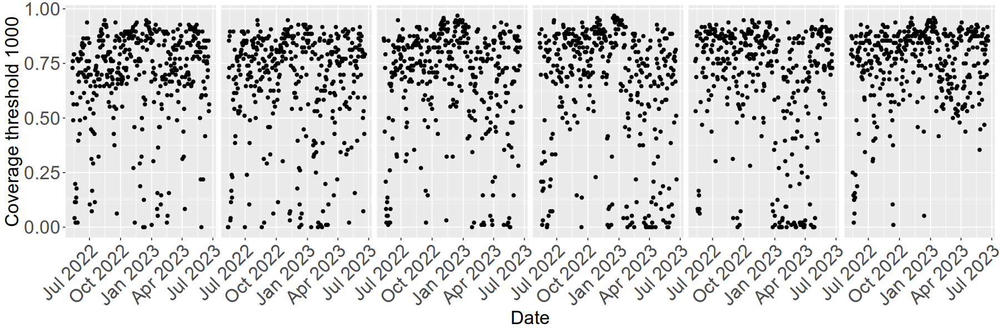

In [14]:
#visualisation of the coverage for all locations
#First let us define the individual plots for each threshold.

options(repr.plot.width=15, repr.plot.height=5)

#the individual plots
plot_100 <- coverage_threshold100 %>%  ggplot(aes(date, coverage)) + geom_point() + facet_wrap(~location, ncol = num_locations) + 
            theme(axis.text.x = element_blank(), axis.title.x = element_blank(), axis.text.y = element_text(size = 20), axis.title.y = element_text(size = 20),strip.text = element_text(size = 20) ) + ylab("Coverage threshold 100")

plot_200 <- coverage_threshold200 %>%  ggplot(aes(date, coverage)) + geom_point() + facet_wrap(~location, ncol = num_locations) + 
        theme(axis.text.x = element_blank(), axis.title.x = element_blank(), axis.text.y = element_text(size = 20), axis.title.y = element_text(size = 20), strip.text = element_blank(),
        strip.background = element_rect(fill = "lightgrey")) + ylab("Coverage threshold 200")

plot_1000 <- coverage_threshold1000 %>%  ggplot(aes(date, coverage)) + geom_point() + facet_wrap(~location, ncol = num_locations) + 
        theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 20), axis.text.y = element_text(size = 20), axis.title.x = element_text(size = 20), axis.title.y = element_text(size = 20), strip.text = element_blank(),
        strip.background = element_rect(fill = "lightgrey"))+ylab("Coverage threshold 1000") +xlab("Date")


print(plot_100)
print(plot_200)
print(plot_1000)
      



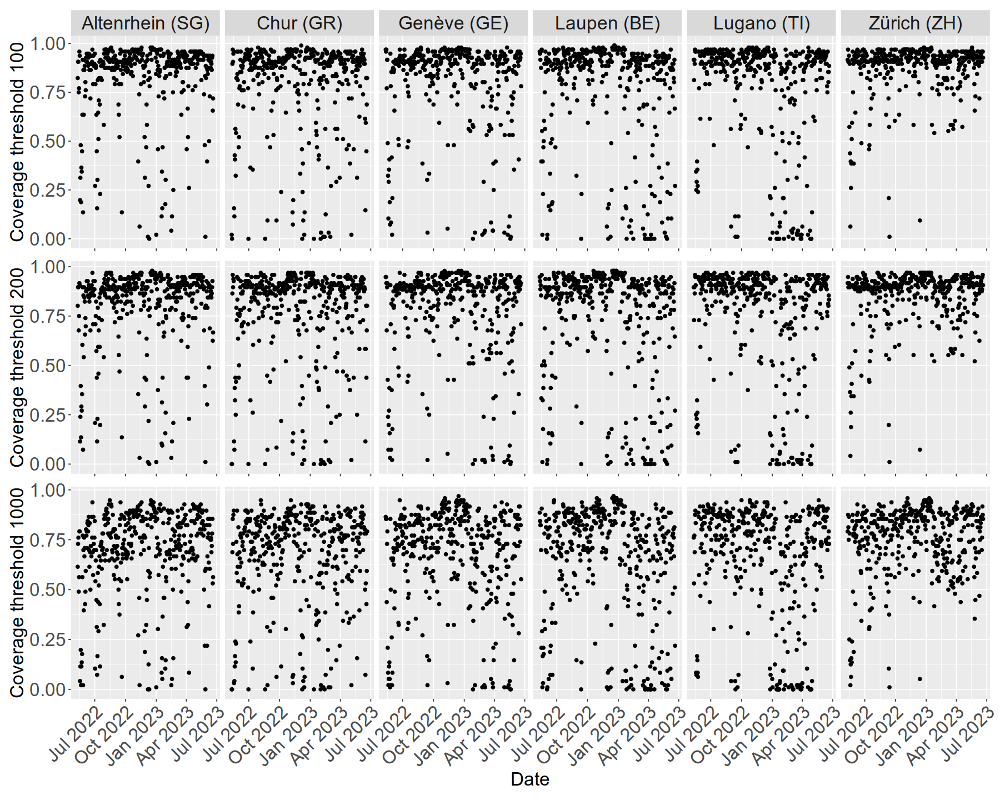

In [15]:
# Combine the plots into one figure:

#Adapt the size of the final plot
options(repr.plot.width = 15, repr.plot.height = 12) 

#Load the necessary library
library(patchwork)

#Combine
combined_plot_coverage <- plot_100 + plot_200 + plot_1000 + 
  plot_layout(ncol = 1) + # Arranges the plots in one column
  plot_annotation(title = NULL)

print(combined_plot_coverage)

#Save the combined plot
ggsave("combined_coverage.eps", plot = combined_plot_coverage, path="FinalReport/figures", width = 15, height = 12)


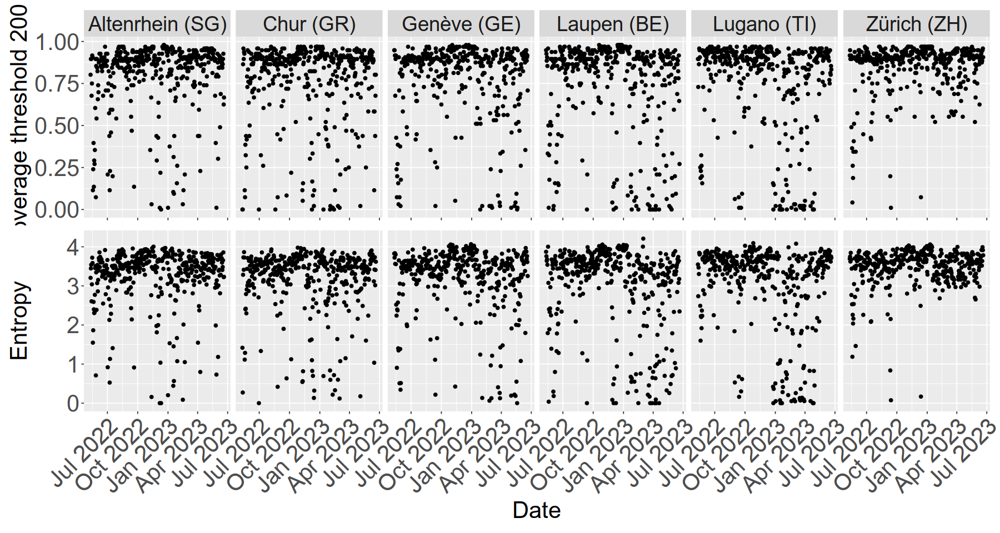

In [16]:
#Combine entropy and coverage in one plot
number = 25

#Adapt the size of the final plot
options(repr.plot.width = 15, repr.plot.height = 8)

#redefine coverage plot in order to combine it with entropy
plot_200_combined <- coverage_threshold200 %>%  ggplot(aes(date, coverage)) + geom_point() + facet_wrap(~location, ncol = num_locations) + 
        theme(axis.text.x = element_blank(), axis.title.x = element_blank(), axis.text.y = element_text(size = 25), axis.title.y = element_text(size = 25), 
        strip.text = element_text(size = 22),) + ylab("Coverage threshold 200")

#redefine the entropy plot
entropy_plot_combined <- sum_entropy_psd %>%  ggplot(aes(date, entropy)) + geom_point() + facet_wrap(~location, ncol = num_locations) + 
                    theme(axis.text.x = element_text(angle = 45, hjust = 1, size = number), axis.text.y = element_text(size = number), 
                  axis.title.x = element_text(size = number), axis.title.y = element_text(size = number),strip.text = element_blank()) +
                  xlab("Date") + ylab("Entropy")

#Combine these two plots
entropy_coverage_plot <- plot_200_combined + entropy_plot_combined + 
  plot_layout(ncol = 1) + # Arranges the plots in one column
  plot_annotation(title = NULL)

print(entropy_coverage_plot)
ggsave("combined_entropy_coverage.eps", plot = entropy_coverage_plot, path="FinalReport/figures", width = 15, height = 10)


### Calculate the correlation between entropy and coverage

In [17]:
#create a datatable containing both coverage and entropy
coverage_entropy_together <- merge(sum_entropy_psd, coverage_threshold200, by = c("date", "location"))
head(coverage_entropy_together)

date,location,entropy,coverage
2022-05-11,Altenrhein (SG),3.205873,0.8020833
2022-05-11,Chur (GR),1.417030,0.0000000
2022-05-11,Genève (GE),3.826536,0.9479167
2022-05-11,Laupen (BE),3.872793,0.9479167
2022-05-11,Lugano (TI),3.548031,0.8958333
2022-05-11,Zürich (ZH),3.693997,0.9166667


In [18]:
#calculate the corelation
correlation_coverage_entropy <- data.frame(location = character(), 
                      pearson_r = numeric(), 
                      spearman_s = numeric(), 
                      stringsAsFactors = FALSE)

for (loc in unique(coverage_entropy_together$location)){
    data_by_location <- coverage_entropy_together %>% filter(location == loc)
    r <-round(cor(data_by_location$entropy, data_by_location$coverage),2)
    s <-round(cor(data_by_location$entropy, data_by_location$coverage, method = 'spearman'),2)
    correlation_coverage_entropy <- rbind(correlation_coverage_entropy, data.frame(location = loc, pearson_r = r, spearman_s = s))
    
}

print(correlation_coverage_entropy)

         location pearson_r spearman_s
1 Altenrhein (SG)      0.95       0.93
2       Chur (GR)      0.94       0.91
3     Genève (GE)      0.94       0.92
4     Laupen (BE)      0.97       0.94
5     Lugano (TI)      0.96       0.92
6     Zürich (ZH)      0.91       0.93


In [19]:
#generate LaTeX table code
latex_table <- kable(correlation_coverage_entropy, format = "latex", booktabs = TRUE, 
                     col.names = c("Location", "Pearson r", "Spearman s"))

# Print the LaTeX table code
cat(latex_table)



\begin{tabular}{lrr}
\toprule
Location & Pearson r & Spearman s\\
\midrule
Altenrhein (SG) & 0.95 & 0.93\\
Chur (GR) & 0.94 & 0.91\\
Genève (GE) & 0.94 & 0.92\\
Laupen (BE) & 0.97 & 0.94\\
Lugano (TI) & 0.96 & 0.92\\
\addlinespace
Zürich (ZH) & 0.91 & 0.93\\
\bottomrule
\end{tabular}

`geom_smooth()` using formula = 'y ~ x'`geom_smooth()` using formula = 'y ~ x'Warning message in grid.Call.graphics(C_polygon, x$x, x$y, index):
“semi-transparency is not supported on this device: reported only once per page”

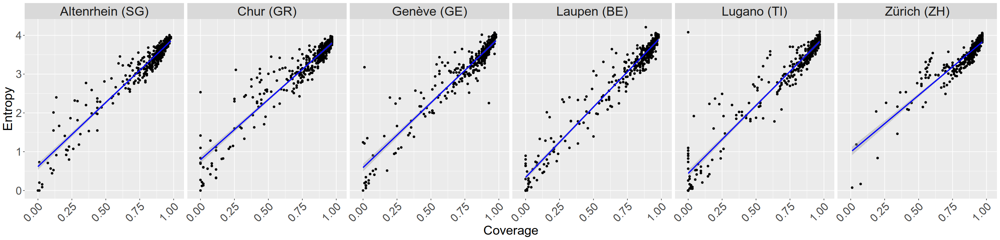

In [20]:
options(repr.plot.width=25, repr.plot.height=6)
number=20
coverage_entropy_together %>%  ggplot(aes(coverage, entropy)) + geom_point() + facet_wrap(~location, ncol = num_locations) + 
                    theme(axis.text.x = element_text(angle = 45, hjust = 1, size = number), axis.text.y = element_text(size = number), 
                  axis.title.x = element_text(size = 23), axis.title.y = element_text(size = 23),strip.text = element_text(size=23))+
                  xlab("Coverage") + ylab("Entropy") + geom_smooth(method="lm", col = "blue") +
                  scale_x_continuous(expand = expansion(mult = c(0.1, 0.1)))  # Add some space on the x-axis

ggsave("correlation.eps", path="FinalReport/figures", width = 16, height = 6)


### Plot coverage with color coded delay

In [21]:
#Define datatables coverage_model_threshold that contain both coverage and delay
dt_no_repetition <- dt %>% distinct(date, location, .keep_all = TRUE)
coverage_model_1000 <- merge(dt_no_repetition,coverage_threshold1000, by = c("date", "location"))
coverage_model_100 <-  merge(dt_no_repetition,coverage_threshold100, by = c("date", "location"))
coverage_model_200 <-  merge(dt_no_repetition,coverage_threshold200, by = c("date", "location"))


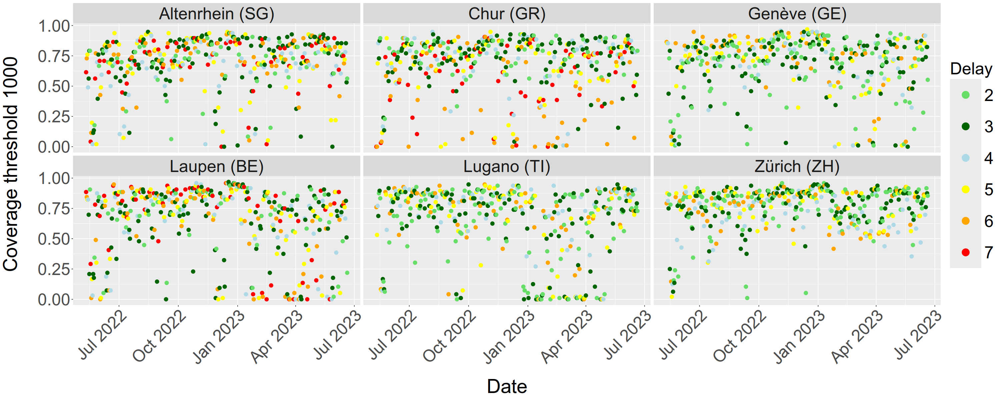

In [22]:
#plot of coverage with colored delays
options(repr.plot.width=25, repr.plot.height=10)
custom_colors <- c("2" = "#66DD66", "3" = "darkgreen" , "4" = "lightblue", "5" = "yellow" , "6"= "orange", "7" = "red")
coverage_model_1000 %>%  
    ggplot(aes(date, coverage, color = factor(delay))) + geom_point(size=3) + facet_wrap(~location) + 
    scale_color_manual(name = "Delay", values = custom_colors) + labs(x="Date", y= "Coverage threshold 1000") +
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 30), axis.text.y = element_text(size = 30), 
          axis.title.x = element_text(size = 35,margin = margin(t=20)), axis.title.y = element_text(size = 35,margin = margin(r=30)),strip.text = element_text(size = 30), legend.text = element_text(size = 30),
         legend.title = element_text(size=30), legend.key.size = unit(2.5, "cm"), legend.key.height = unit(2, "cm"),legend.key.width = unit(2, "cm") ) +
     guides(color = guide_legend(override.aes = list(size = 6))) 

ggsave("coverage_delay_colors.eps", path="FinalReport/figures", width = 25, height=15)


# Low entropy data


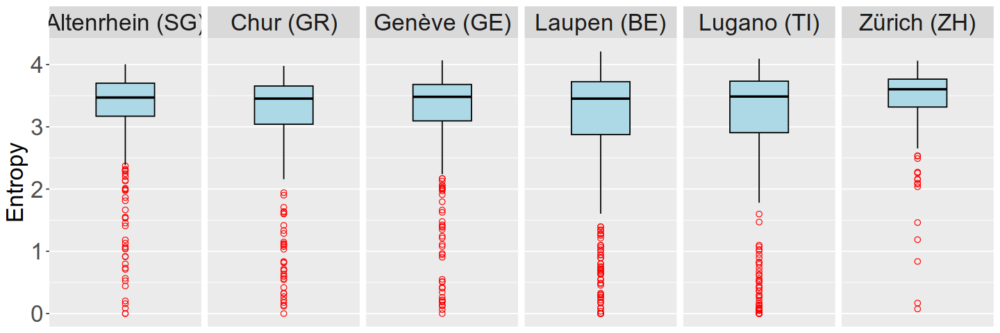

In [23]:
options(repr.plot.width=12, repr.plot.height=4)

#Start with plotting boxplots of entropy 
ggplot(sum_entropy_psd, aes(y = entropy)) +
  geom_boxplot(fill = "lightblue", color = "black", outlier.colour="red", outlier.shape=1,
             outlier.size=2, notch=FALSE) +
              labs(y = "Entropy") + facet_wrap(~location, ncol=6)+
              theme(axis.text.y = element_text(size = 20), 
           axis.title.y = element_text(size = 20), strip.text = element_text(size = 20)) + scale_x_discrete()

ggsave("boxplot_entropy.eps", path="FinalReport/figures", width =12, height =4)


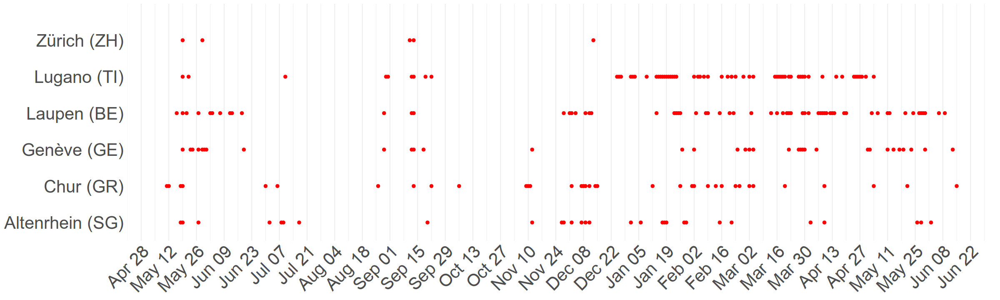

In [24]:
options(repr.plot.width=20, repr.plot.height=6)

# analyzing data with entropy <2
threshold <- 2

#filter data for low entropy values
low_entropy_data <- sum_entropy_psd %>% filter(entropy < threshold)

#plot the low entropy data for each location
ggplot(low_entropy_data, aes(x = date, y = location)) +
  geom_point(size = 2, color = "red") +
  scale_y_discrete(expand = expansion(mult = c(0.1, 0.2))) +  # Add space at top and bottom of y-axis
  scale_x_date(date_labels = "%b %d", date_breaks = "14 days") +
  labs(x = NULL, y = NULL, title = NULL) +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 25),
        axis.text.y = element_text(size = 25),
        panel.grid.major.y = element_blank(),   #Remove horizontal grid lines
        panel.grid.minor.y = element_blank())

ggsave("low_entropy.eps", path="FinalReport/figures", width =20, height = 8)


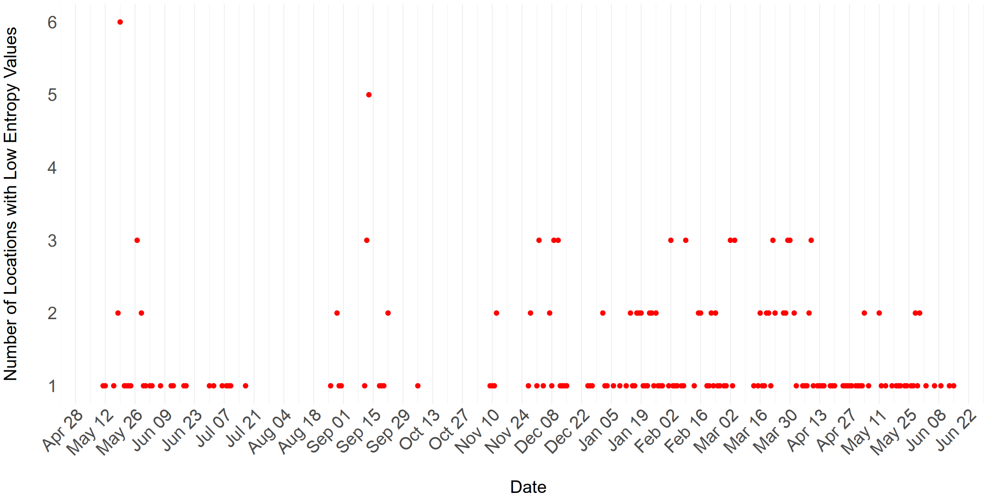

In [25]:
options(repr.plot.width=20, repr.plot.height=10)

# Count the number of location that have a low entropy value on a given day
low_entropy_counts <- low_entropy_data %>%
  group_by(date) %>%
  summarise(count = n()) #n() is a function that returns the number of rows in each group

# Plot
ggplot(low_entropy_counts, aes(x = date, y = count)) +
  geom_point(size=3, color = "red") +
  scale_y_continuous(breaks = 1:6) +
  scale_x_date(date_labels = "%b %d", date_breaks = "14 days") +
  labs(x = "Date", y = "Number of Locations with Low Entropy Values", title = NULL) +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 25),
        axis.text.y = element_text(size = 25), axis.title.x = element_text(size = 25, margin = margin(t=30)),
        axis.title.y = element_text(size = 25, 
        margin = margin(r=40)),
        panel.grid.major.y = element_blank(),  # Remove horizontal grid lines
        panel.grid.minor.y = element_blank())

ggsave("low_entropy_count.eps", path="FinalReport/figures", width =20, height = 10)


### Coverage

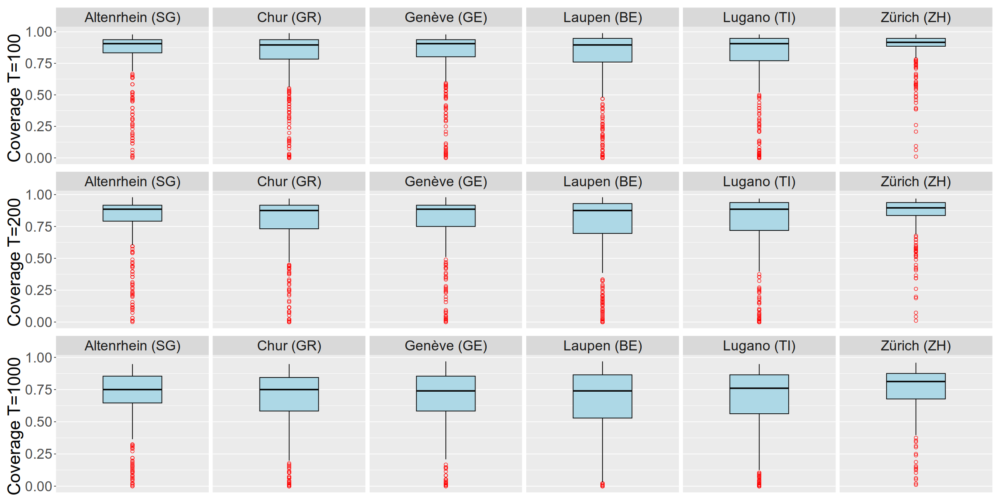

In [26]:
options(repr.plot.width=20, repr.plot.height=10)

boxplot_100 <- ggplot(coverage_threshold100, aes(y = coverage)) +
  geom_boxplot(fill = "lightblue", color = "black", outlier.colour="red", outlier.shape=1,
             outlier.size=2, notch=FALSE) +
              labs(y = "Coverage T=100 ") + facet_wrap(~location, ncol = 6)+
              theme(axis.text.y = element_text(size = 20), 
           axis.title.y = element_text(size = 25), strip.text = element_text(size = 20)) + scale_x_discrete()

boxplot_200 <- ggplot(coverage_threshold200, aes(y = coverage)) +
  geom_boxplot(fill = "lightblue", color = "black", outlier.colour="red", outlier.shape=1,
             outlier.size=2, notch=FALSE) +
              labs(y = "Coverage T=200 ") + facet_wrap(~location, ncol = 6)+
              theme(axis.text.y = element_text(size = 20), 
           axis.title.y = element_text(size = 25), strip.text = element_text(size = 20)) + scale_x_discrete()

boxplot_1000 <- ggplot(coverage_threshold1000, aes(y = coverage)) +
  geom_boxplot(fill = "lightblue", color = "black", outlier.colour="red", outlier.shape=1,
             outlier.size=2, notch=FALSE) +
              labs(y = "Coverage T=1000 ") + facet_wrap(~location, ncol = 6)+
              theme(axis.text.y = element_text(size = 20), 
           axis.title.y = element_text(size = 25), strip.text = element_text(size = 20)) + scale_x_discrete()

boxplot_coverage <- boxplot_100 + boxplot_200 + boxplot_1000 + 
  plot_layout(ncol = 1) + # Arranges the plots in one column
  plot_annotation(title = NULL)

print(boxplot_coverage)
ggsave("boxplot_coverage.eps", path="FinalReport/figures", width = 20, height = 10)


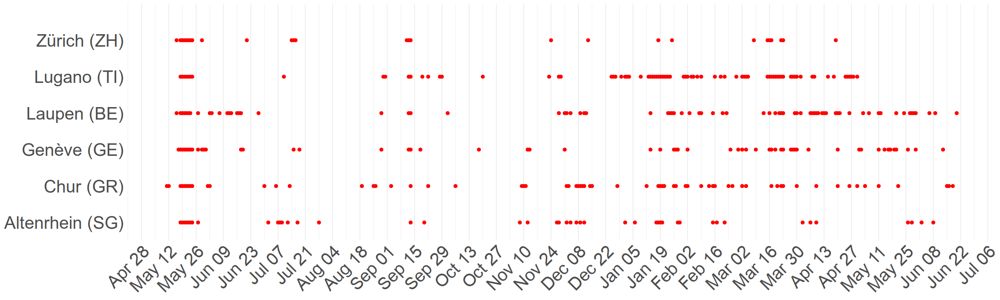

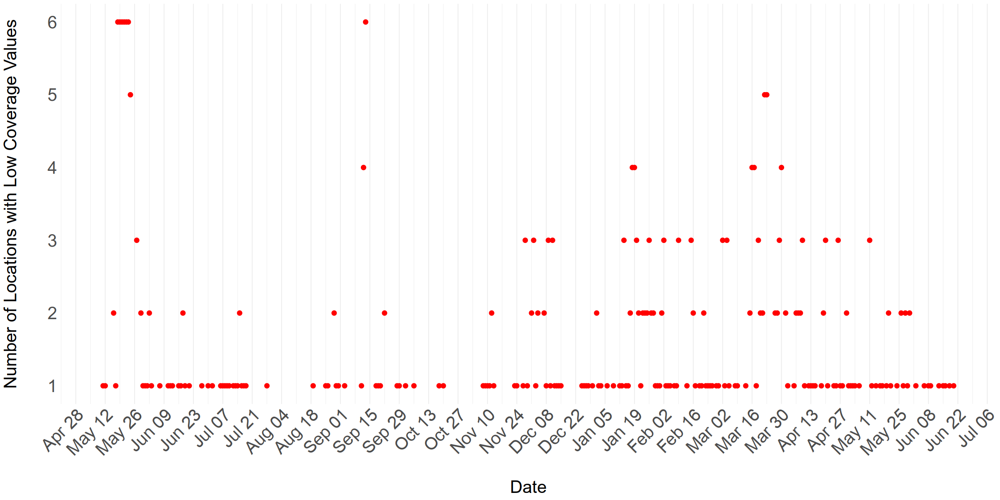

In [27]:
options(repr.plot.width=20, repr.plot.height=6)

# analyzing data with coverage T=100 < 0.6
threshold_coverage_100 <- 0.6

#filter data for low entropy values
low_coverage_100_data <- coverage_threshold100 %>% filter(coverage < threshold_coverage_100)

#plot the low entropy data for each location
ggplot(low_coverage_100_data, aes(x = date, y = location)) +
  geom_point(size = 2, color = "red") +
  scale_y_discrete(expand = expansion(mult = c(0.1, 0.2))) +  # Add space at top and bottom of y-axis
  scale_x_date(date_labels = "%b %d", date_breaks = "14 days") +
  labs(x = NULL, y = NULL, title = NULL) +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 25),
        axis.text.y = element_text(size = 25),
        panel.grid.major.y = element_blank(),   #Remove horizontal grid lines
        panel.grid.minor.y = element_blank())

ggsave("low_coverage_100.eps", path="FinalReport/figures", width =20, height = 8)

options(repr.plot.width=20, repr.plot.height=10)

# Count the number of location that have a low entropy value on a given day
low_coverage_100_counts <- low_coverage_100_data %>%
  group_by(date) %>%
  summarise(count = n()) #n() is a function that returns the number of rows in each group

# Plot
ggplot(low_coverage_100_counts, aes(x = date, y = count)) +
  geom_point(size=3, color = "red") +
  scale_y_continuous(breaks = 1:6) +
  scale_x_date(date_labels = "%b %d", date_breaks = "14 days") +
  labs(x = "Date", y = "Number of Locations with Low Coverage Values", title = NULL) +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 25),
        axis.text.y = element_text(size = 25), axis.title.x = element_text(size = 25, margin = margin(t=30)),
        axis.title.y = element_text(size = 25, 
        margin = margin(r=40)),
        panel.grid.major.y = element_blank(),  # Remove horizontal grid lines
        panel.grid.minor.y = element_blank())

ggsave("low_coverage_100_count.eps", path="FinalReport/figures", width =20, height = 10)



In [28]:
#looking for dates that have low coverage in all locations
coverage_threshold100 <- coverage_threshold100 %>%
  mutate(date = as.Date(date)) 
coverage_threshold100 %>% filter(coverage < 0.6, location == "Chur (GR)", between(date, as.Date("2022-05-12"), as.Date("2022-05-30")))
coverage_threshold100 %>% filter(coverage < 0.6, location == "Zürich (ZH)", between(date, as.Date("2022-05-12"), as.Date("2022-05-30")))
#the dates are May 18 - May 24

location,date,coverage
Chur (GR),2022-05-12,0.0000000
Chur (GR),2022-05-18,0.1562500
Chur (GR),2022-05-19,0.1145833
Chur (GR),2022-05-20,0.4270833
Chur (GR),2022-05-21,0.4062500
Chur (GR),2022-05-22,0.5625000
Chur (GR),2022-05-23,0.3229167
Chur (GR),2022-05-24,0.5416667


location,date,coverage
Zürich (ZH),2022-05-16,0.5729167
Zürich (ZH),2022-05-18,0.4375000
Zürich (ZH),2022-05-19,0.0625000
Zürich (ZH),2022-05-20,0.3958333
Zürich (ZH),2022-05-21,0.2604167
Zürich (ZH),2022-05-22,0.3854167
Zürich (ZH),2022-05-23,0.5104167
Zürich (ZH),2022-05-24,0.5937500
Zürich (ZH),2022-05-29,0.3854167


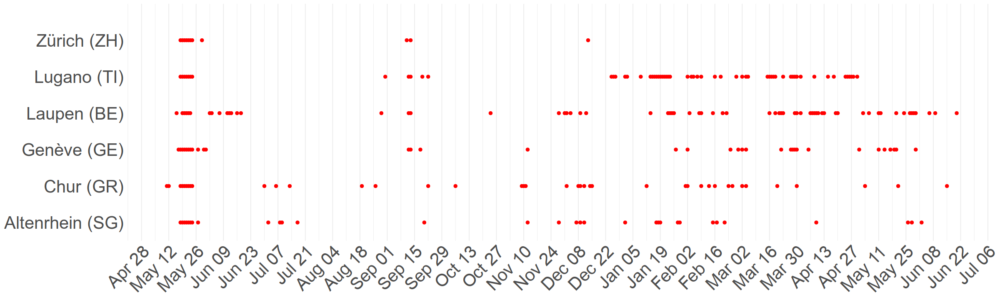

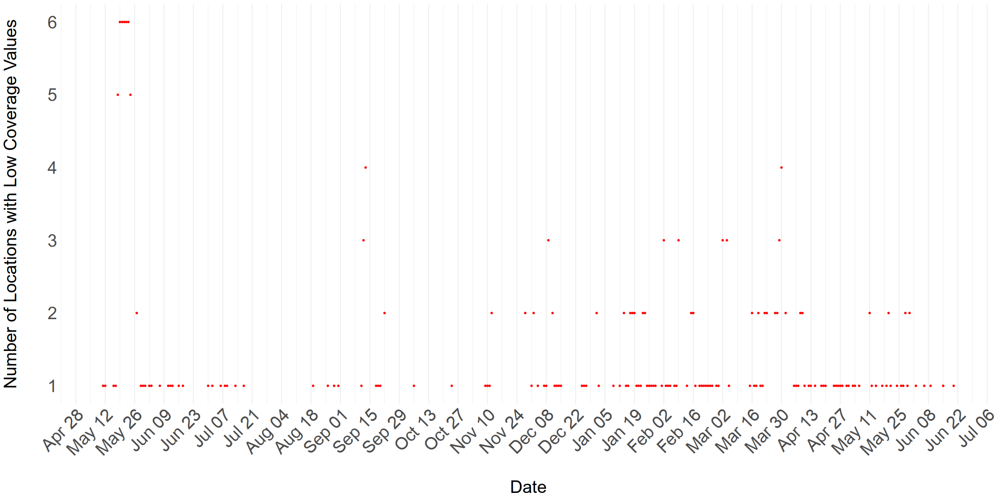

In [29]:
options(repr.plot.width=20, repr.plot.height=6)

# analyzing data with coverage T=1000 < 0.25
threshold_coverage_1000 <- 0.25

#filter data for low entropy values
low_coverage_1000_data <- coverage_threshold1000 %>% filter(coverage < threshold_coverage_1000)

#plot the low entropy data for each location
ggplot(low_coverage_1000_data, aes(x = date, y = location)) +
  geom_point(size = 2, color = "red") +
  scale_y_discrete(expand = expansion(mult = c(0.1, 0.2))) +  # Add space at top and bottom of y-axis
  scale_x_date(date_labels = "%b %d", date_breaks = "14 days") +
  labs(x = NULL, y = NULL, title = NULL) +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 25),
        axis.text.y = element_text(size = 25),
        panel.grid.major.y = element_blank(),   #Remove horizontal grid lines
        panel.grid.minor.y = element_blank())

#ggsave("low_entropy.eps", path="FinalReport/figures", width =20, height = 8)

options(repr.plot.width=20, repr.plot.height=10)

# Count the number of location that have a low entropy value on a given day
low_coverage_1000_counts <- low_coverage_1000_data %>%
  group_by(date) %>%
  summarise(count = n()) #n() is a function that returns the number of rows in each group

# Plot
ggplot(low_coverage_1000_counts, aes(x = date, y = count)) +
  geom_point(size=1, color = "red") +
  scale_y_continuous(breaks = 1:6) +
  scale_x_date(date_labels = "%b %d", date_breaks = "14 days") +
  labs(x = "Date", y = "Number of Locations with Low Coverage Values", title = NULL) +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 25),
        axis.text.y = element_text(size = 25), axis.title.x = element_text(size = 25, margin = margin(t=30)),
        axis.title.y = element_text(size = 25, 
        margin = margin(r=40)),
        panel.grid.major.y = element_blank(),  # Remove horizontal grid lines
        panel.grid.minor.y = element_blank())

#ggsave("low_entropy_count.eps", path="FinalReport/figures", width =20, height = 10)



# Power spectral density

In [30]:
find_psd_by_location_entropy <- function(ww_data) {
  psdframe <- data.table()

  #for each location we calculate the spectral density
  for (ara in unique(ww_data$location)) {
    values <- ww_data[ww_data$location == ara,]$entropy
      
    # Compute Periodogram using the stats package
    spec <- spectrum(values, plot = FALSE)
    
    frequency <- spec$freq
    psd <- spec$spec
    
    araframe <- data.table(
      frequency = frequency, 
      PSD = psd, 
      WWTP = ara
    )
    psdframe <- rbind(psdframe, araframe)
  }

  #plot the resulting graph
  psd_plot <- ggplot() + 
    geom_line(data = psdframe, aes(x = 1 / frequency, y = PSD, color = WWTP)) + 
    xlab('Period (days)') +
    xlim(c(2, 9)) +
    ylim(c(0,10))+
    facet_wrap(~ WWTP)+
    theme(axis.text.x=element_text(size=number), axis.text.y = element_text(size = number), 
    axis.title.x = element_text(size = number), axis.title.y = element_text(size = number),
    strip.text = element_text(size = number),legend.position = "none")
  
  
    print(psd_plot)
    
  return(psdframe)
}

#___________________________________________________________________________________________
find_psd_by_location_coverage <- function(ww_data) {
  psdframe <- data.table()
  
  for (ara in unique(ww_data$location)) {
    values <- ww_data[ww_data$location == ara,]$coverage
      
    # Compute Periodogram using the stats package
    spec <- spectrum(values, plot = FALSE)
    
    frequency <- spec$freq
    psd <- spec$spec
    
    araframe <- data.table(
      frequency = frequency, 
      PSD = psd, 
      WWTP = ara
    )
    psdframe <- rbind(psdframe, araframe)
  }
  
  psd_plot <- ggplot() + 
    geom_line(data = psdframe, aes(x = 1 / frequency, y = PSD, color = WWTP)) + 
    xlab('Period (days)') +
    xlim(c(2, 9)) +
    #ylim(c(0,10))+
    facet_wrap(~ WWTP)+
    theme(axis.text.x=element_text(size=number), axis.text.y = element_text(size = number), 
    axis.title.x = element_text(size = number), axis.title.y = element_text(size = number),
    strip.text = element_text(size = number),legend.position = "none")  
    print(psd_plot)
    
  return(psdframe)
}



Warning message:
“Removed 267 rows containing missing values or values outside the scale range (`geom_line()`).”

frequency,PSD,WWTP
0.002469136,0.100841366,Altenrhein (SG)
0.004938272,0.218098593,Altenrhein (SG)
0.007407407,0.003651562,Altenrhein (SG)
0.009876543,0.003434538,Altenrhein (SG)
0.012345679,0.029945948,Altenrhein (SG)
0.014814815,0.538659298,Altenrhein (SG)
0.017283951,0.014070575,Altenrhein (SG)
0.019753086,0.062170086,Altenrhein (SG)
0.022222222,0.228306246,Altenrhein (SG)
0.024691358,0.134771396,Altenrhein (SG)


Warning message:
“Removed 267 rows containing missing values or values outside the scale range (`geom_line()`).”

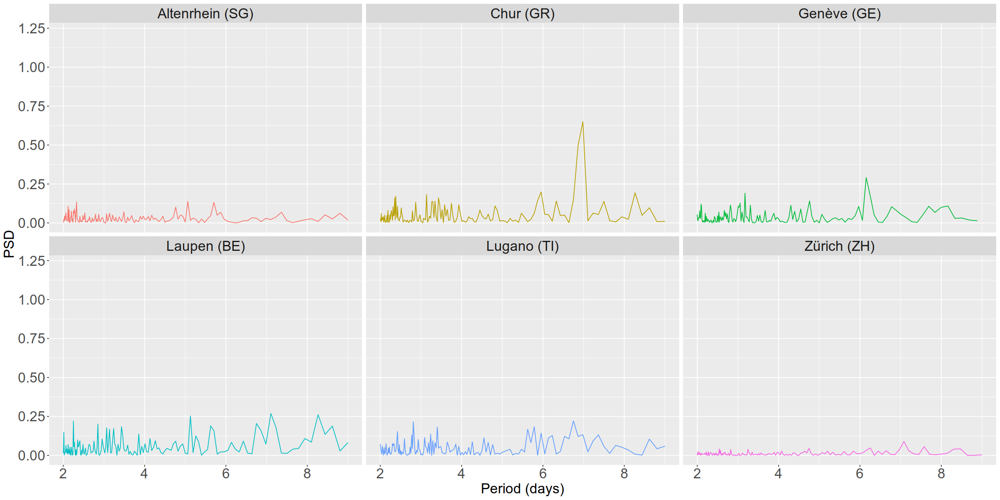

In [31]:
find_psd_by_location_coverage(coverage_threshold100)
ggsave("period_coverage.eps", path="FinalReport/figures", width =12, height = 4)


Warning message:
“Removed 267 rows containing missing values or values outside the scale range (`geom_line()`).”

frequency,PSD,WWTP
0.002469136,1.176172064,Altenrhein (SG)
0.004938272,3.741773428,Altenrhein (SG)
0.007407407,0.370559545,Altenrhein (SG)
0.009876543,0.023785855,Altenrhein (SG)
0.012345679,0.620376809,Altenrhein (SG)
0.014814815,7.741314915,Altenrhein (SG)
0.017283951,0.009496879,Altenrhein (SG)
0.019753086,0.787166044,Altenrhein (SG)
0.022222222,2.924220805,Altenrhein (SG)
0.024691358,2.322726694,Altenrhein (SG)


Warning message:
“Removed 267 rows containing missing values or values outside the scale range (`geom_line()`).”

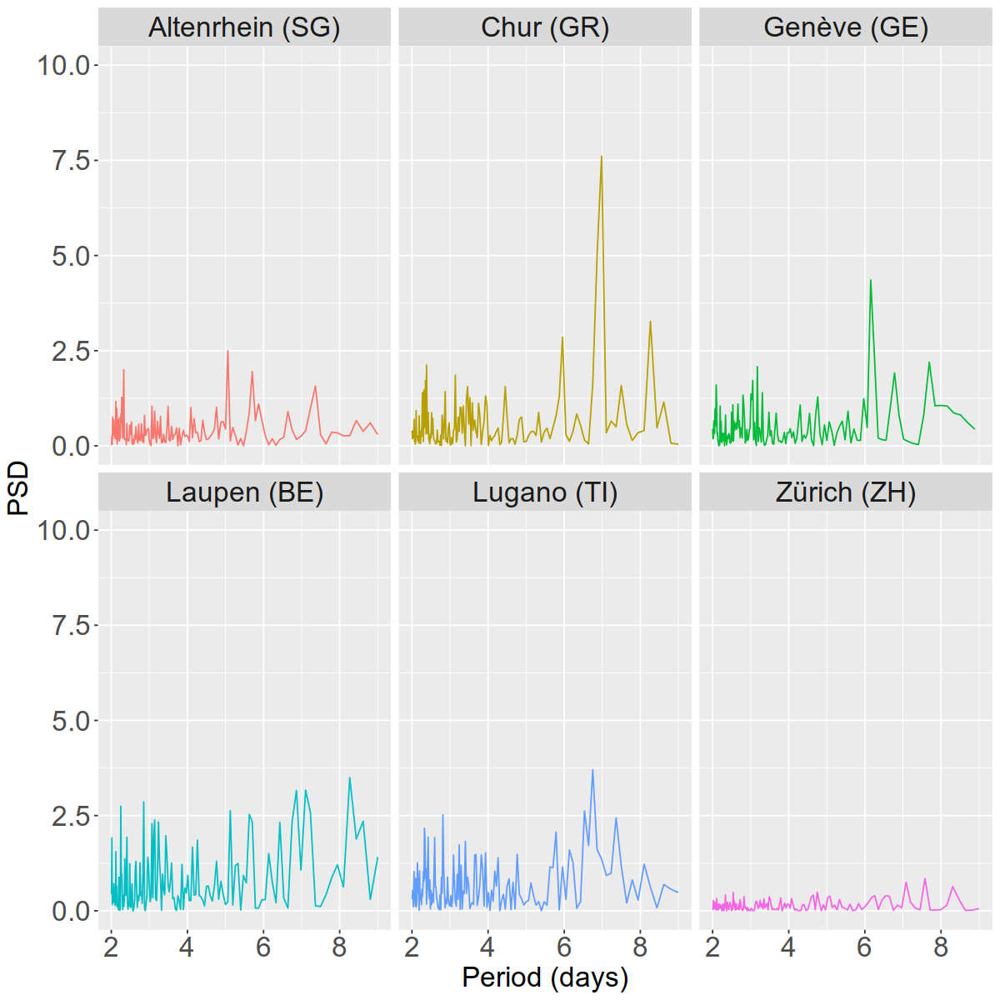

In [32]:
options(repr.plot.width=10, repr.plot.height=10)

find_psd_by_location_entropy(sum_entropy_psd)
ggsave("period.eps", path="FinalReport/figures", width =12, height = 4)



# More exploratory analysis

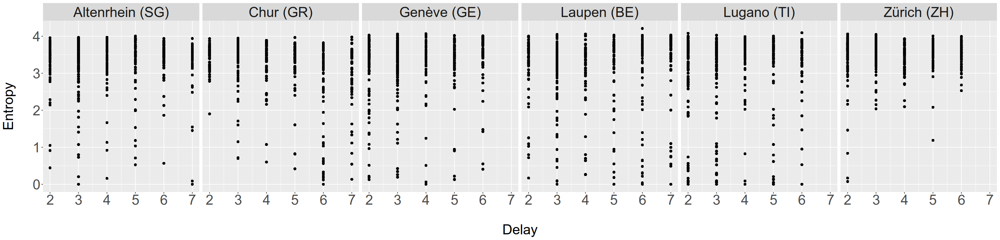

In [33]:
#plot entropy vs. delay 
options(repr.plot.width=25, repr.plot.height=6)
number = 25

sum_entropy %>%  
    ggplot(aes(delay, entropy)) + geom_point() + facet_wrap(~location, ncol = num_locations) +
    theme(axis.text.x=element_text(size=number), axis.text.y = element_text(size = number), 
                  axis.title.x = element_text(size = number, margin = margin(t=30)), axis.title.y = element_text(size = number, margin = margin(r=30)),
                  strip.text = element_text(size = number)) +
                  xlab("Delay") + ylab("Entropy")

ggsave("entropy_delay_all.eps", path="FinalReport/figures", width = 20, height = 7)



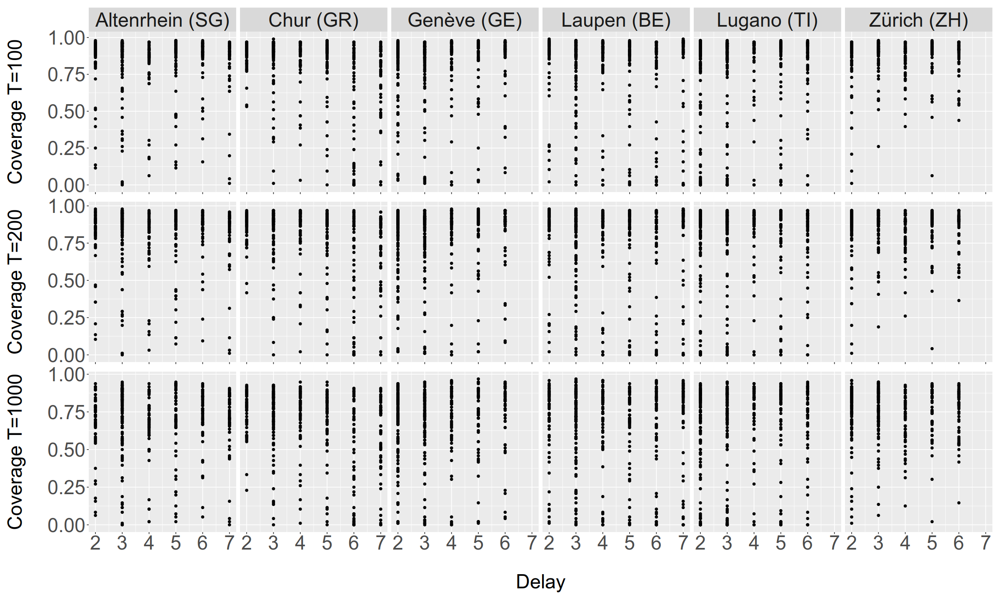

In [34]:
#plot coverage vs. delay 
options(repr.plot.width=20, repr.plot.height=12)
number = 28

cov_delay_100 <- coverage_model_100 %>%  
    ggplot(aes(delay, coverage)) + geom_point() + facet_wrap(~location, ncol = num_locations) + 
    theme(axis.text.x=element_blank(), axis.text.y = element_text(size = number), 
                  axis.title.x = element_blank(), axis.title.y = element_text(size = number,margin = margin(r=30)),
                  strip.text = element_text(size = number)) +
                  xlab("Delay") + ylab("Coverage T=100")

cov_delay_200 <- coverage_model_200 %>%  
    ggplot(aes(delay, coverage)) + geom_point() + facet_wrap(~location, ncol = num_locations) + 
    theme(axis.text.x=element_blank(), axis.text.y = element_text(size = number), 
                  axis.title.x = element_blank(), axis.title.y = element_text(size = number,margin = margin(r=30)),
                  strip.text = element_blank()) +
                  xlab("Delay") + ylab("Coverage T=200")

cov_delay_1000 <- coverage_model_1000 %>%  
    ggplot(aes(delay, coverage)) + geom_point() + facet_wrap(~location, ncol = num_locations) + 
    theme(axis.text.x=element_text(size=number), axis.text.y = element_text(size = number), 
                  axis.title.x = element_text(size = number,margin = margin(t=30)), axis.title.y = element_text(size = number,margin = margin(r=30)),
                  strip.text = element_blank()) +
                  xlab("Delay") + ylab("Coverage T=1000")

coverage_delay_plot <- cov_delay_100 + cov_delay_200 + cov_delay_1000 + 
  plot_layout(ncol = 1) + # Arranges the plots in one column
  plot_annotation(title = NULL)

print(coverage_delay_plot)
ggsave("coverage_delay.eps", plot = coverage_delay_plot, path="FinalReport/figures", width = 20, height = 12)


Saving 6.67 x 6.67 in image

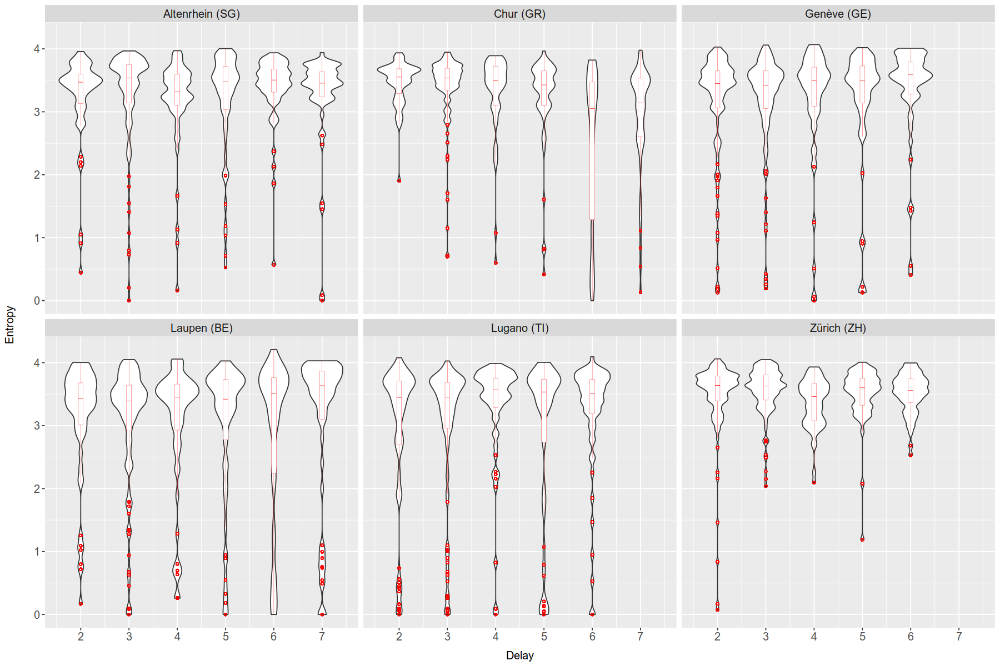

In [35]:
#box plot for entropy vs delay
options(repr.plot.width=15, repr.plot.height=10)
number = 12

sum_entropy %>%  
    ggplot(aes(x=delay, y=entropy, group = delay)) + geom_violin() + 
    geom_boxplot(width=0.1, color="red", outlier.shape = 1, outlier.size = 1, notch=FALSE, lwd=0.1) + 
    scale_x_continuous(breaks = 2:7)+
    facet_wrap(~location)+ theme(axis.text.x=element_text(size=number), axis.text.y = element_text(size = number), 
    axis.title.x = element_text(size = number, margin = margin(t=10)), axis.title.y = element_text(size = number, margin = margin(r=20)),
    strip.text = element_text(size = number)) +
    xlab("Delay") + ylab("Entropy")

ggsave("entropy_violin.eps", path="FinalReport/figures")


Saving 6.67 x 6.67 in image

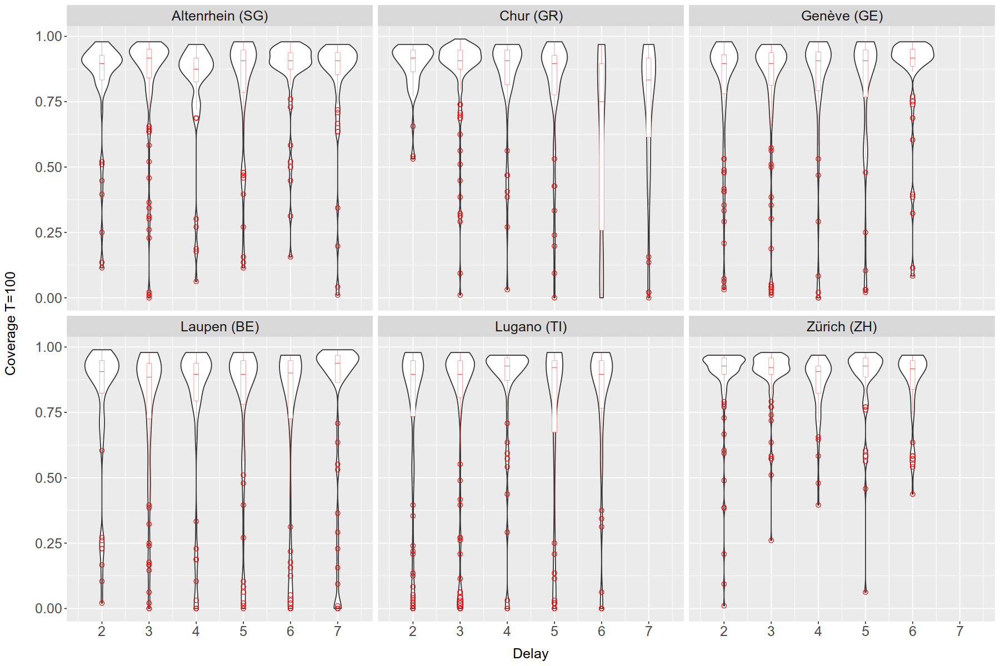

Saving 6.67 x 6.67 in image

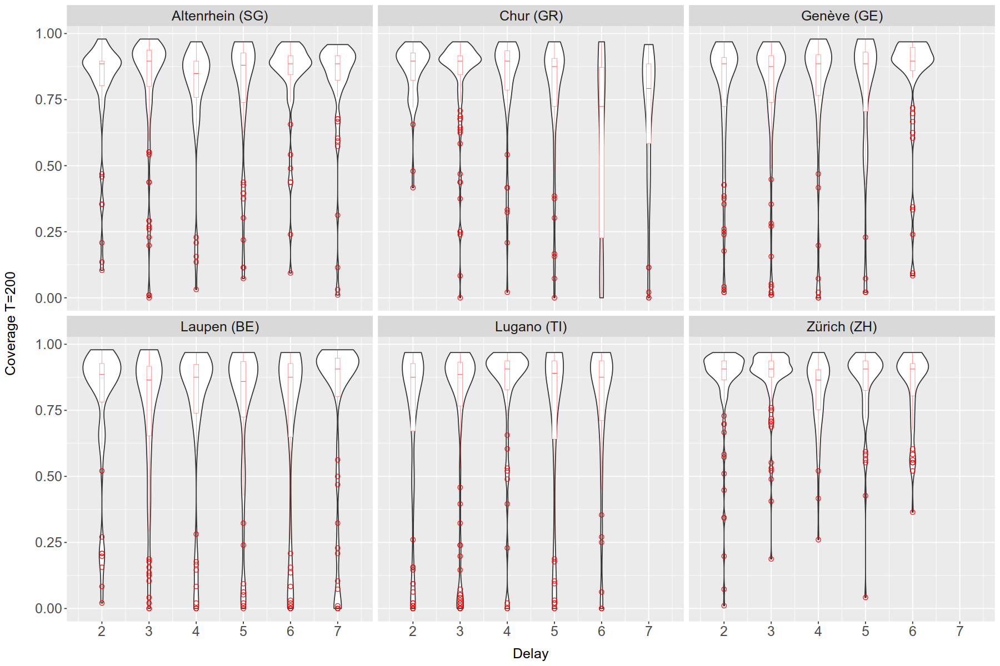

Saving 6.67 x 6.67 in image

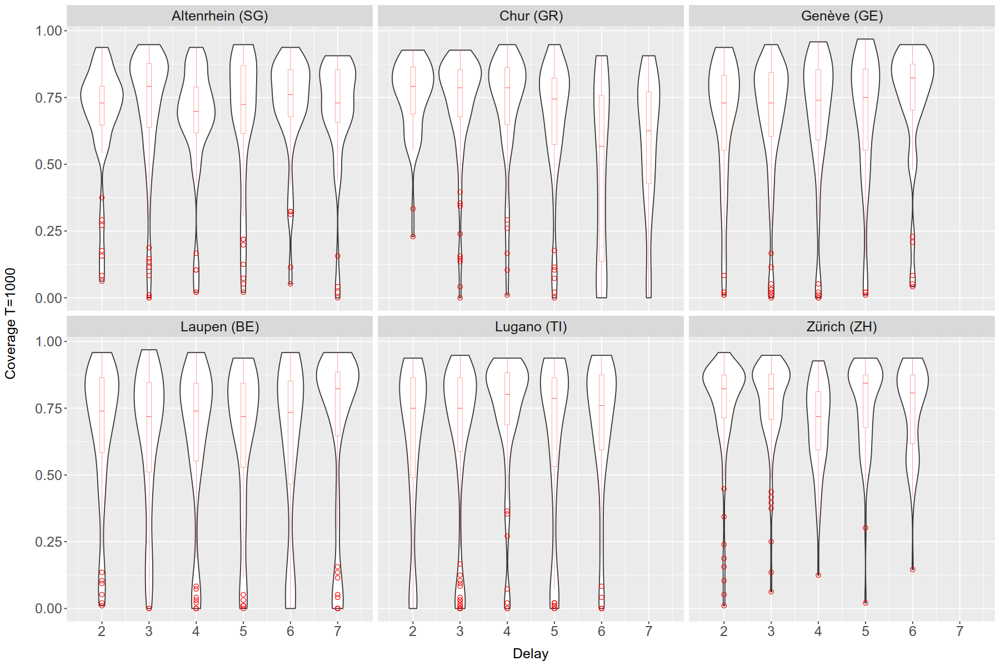

In [36]:
#box plot for coverage_100 vs delay
options(repr.plot.width=15, repr.plot.height=10)
number = 15

coverage_model_100 %>%  
    ggplot(aes(x=delay, y=coverage, group = delay)) + geom_violin() + 
    geom_boxplot(width=0.1, color="red", outlier.shape = 1, outlier.size = 2, notch=FALSE, lwd=0.1) + 
    scale_x_continuous(breaks = 2:7)+
    facet_wrap(~location)+ theme(axis.text.x=element_text(size=number), axis.text.y = element_text(size = number), 
    axis.title.x = element_text(size = number, margin = margin(t=10)), axis.title.y = element_text(size = number, margin = margin(r=20)),
    strip.text = element_text(size = number)) +
    xlab("Delay") + ylab("Coverage T=100")

ggsave("coverage_100_violin.eps", path="FinalReport/figures")


coverage_model_200 %>%  
    ggplot(aes(x=delay, y=coverage, group = delay)) + geom_violin() + 
    geom_boxplot(width=0.1, color="red", outlier.shape = 1, outlier.size = 2, notch=FALSE, lwd=0.1) + 
    scale_x_continuous(breaks = 2:7)+
    facet_wrap(~location)+ theme(axis.text.x=element_text(size=number), axis.text.y = element_text(size = number), 
    axis.title.x = element_text(size = number, margin = margin(t=10)), axis.title.y = element_text(size = number, margin = margin(r=20)),
    strip.text = element_text(size = number)) +
    xlab("Delay") + ylab("Coverage T=200")

ggsave("coverage_200_violin.eps", path="FinalReport/figures")


coverage_model_1000 %>%  
    ggplot(aes(x=delay, y=coverage, group = delay)) + geom_violin() + 
    geom_boxplot(width=0.1, color="red", outlier.shape = 1, outlier.size = 2, notch=FALSE, lwd=0.1) + 
    scale_x_continuous(breaks = 2:7)+
    facet_wrap(~location)+ theme(axis.text.x=element_text(size=number), axis.text.y = element_text(size = number), 
    axis.title.x = element_text(size = number, margin = margin(t=10)), axis.title.y = element_text(size = number, margin = margin(r=20)),
    strip.text = element_text(size = number)) +
    xlab("Delay") + ylab("Coverage T=1000")

ggsave("coverage_1000_violin.eps", path="FinalReport/figures")


# Model quality vs concentration

## Concentrations 2022-23
Importing, cleaning and preparing the concentration data from 2022/23

In [37]:
#import data, change the type of variables, erase columns
dt_viral <- read.csv("Data/clean_data_eawag_2.csv")
char_cols <- c("wwtp", "measuring_period", "measurement_type")
dt_viral[char_cols] <- lapply(dt_viral[char_cols], as.character)
dt_viral$sample_date <- as.Date(dt_viral$sample_date)
dt_viral <- dt_viral %>% filter(measurement_type == "SN2_gc_per_mL_WW")
dt_viral <- as.data.table(dt_viral)
dt_viral <- dt_viral[, c('measuring_period','min', 'max','n_measurements') := NULL]

#Rename columns
dt_viral <- rename(dt_viral, date = sample_date)
dt_viral <- rename(dt_viral, location = wwtp)
dt_viral <- rename(dt_viral, concentration_mean = mean)

#Change the location names
dt_viral[, location := gsub("STEP Aire", "Genève (GE)", location)]
dt_viral[, location := gsub('ARA Altenrhein', 'Altenrhein (SG)', location)]
dt_viral[, location := gsub('ARA Werdh\xf6lzli', "Zürich (ZH)", location)]
dt_viral[, location := gsub('CDA Lugano', 'Lugano (TI)', location)]
dt_viral[, location := gsub('ARA Sensetal', 'Laupen (BE)', location)]
dt_viral[, location := gsub('ARA Chur', 'Chur (GR)', location)]


head(dt_viral)


date,location,measurement_type,concentration_mean
2021-12-03,Zürich (ZH),SN2_gc_per_mL_WW,710.3183
2021-12-06,Zürich (ZH),SN2_gc_per_mL_WW,545.5486
2021-12-06,Genève (GE),SN2_gc_per_mL_WW,257.6585
2021-12-10,Zürich (ZH),SN2_gc_per_mL_WW,565.5879
2021-12-10,Genève (GE),SN2_gc_per_mL_WW,572.5981
2021-12-13,Zürich (ZH),SN2_gc_per_mL_WW,660.0954


In [38]:
#find the starting and ending points of concentration data in Geneva
minimtest <- dt_viral %>% filter(location == "Genève (GE)")
max(minimtest$date)
min(minimtest$date)

#total number of datapoints for concentrations
nrow(dt_viral)

#total number of datapoints for sequence data
nrow(sum_entropy_psd)

[1] "2023-04-04"

[1] "2021-12-06"

[1] 750

[1] 2413

Warning message:
“Removed 28 rows containing missing values or values outside the scale range (`geom_point()`).”Warning message:
“Removed 28 rows containing missing values or values outside the scale range (`geom_point()`).”

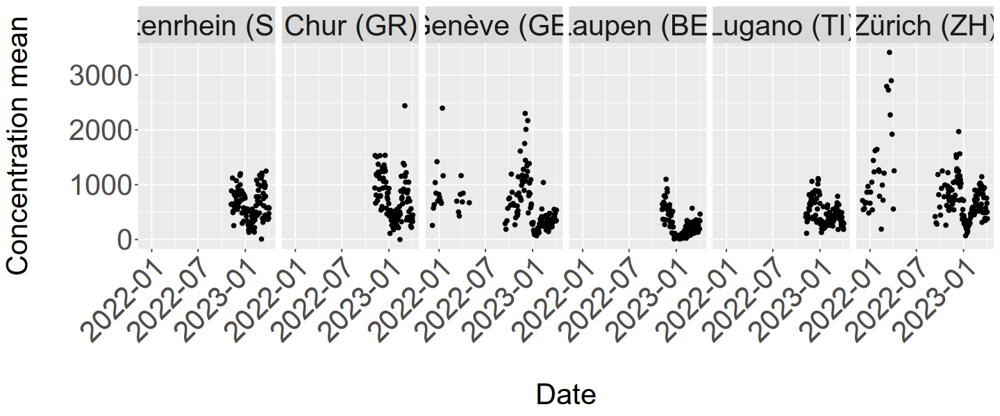

In [39]:
#plot concentration data
options(repr.plot.width=12, repr.plot.height=5)
number = 25

dt_viral %>%  
    ggplot(aes(date, concentration_mean)) + geom_point() + facet_wrap(~location, ncol = num_locations) +
    theme(axis.text.x=element_text(angle = 45, hjust = 1, size=number), axis.text.y = element_text(size = number), 
                  axis.title.x = element_text(size = number, margin = margin(t=30)), axis.title.y = element_text(size = number, margin = margin(r=30)),
                  strip.text = element_text(size = number)) +
                  xlab("Date") + ylab("Concentration mean")

ggsave("concentrations.eps", path="FinalReport/figures", width = 20, height = 7)


In [40]:
#Let us make a datatable that contains entropy and concentration
dt_merge_entropy_viral  <- merge(sum_entropy_psd ,dt_viral, by = c("date", "location"))
head(dt_merge_entropy_viral)

date,location,entropy,measurement_type,concentration_mean
2022-09-12,Zürich (ZH),2.151960,SN2_gc_per_mL_WW,418.3380
2022-09-16,Genève (GE),3.242153,SN2_gc_per_mL_WW,290.4110
2022-09-16,Zürich (ZH),3.585671,SN2_gc_per_mL_WW,304.4148
2022-09-19,Genève (GE),2.670317,SN2_gc_per_mL_WW,187.3793
2022-09-19,Zürich (ZH),3.925209,SN2_gc_per_mL_WW,280.9378
2022-09-23,Genève (GE),3.616675,SN2_gc_per_mL_WW,342.8192


`geom_smooth()` using formula = 'y ~ x'`geom_smooth()` using formula = 'y ~ x'

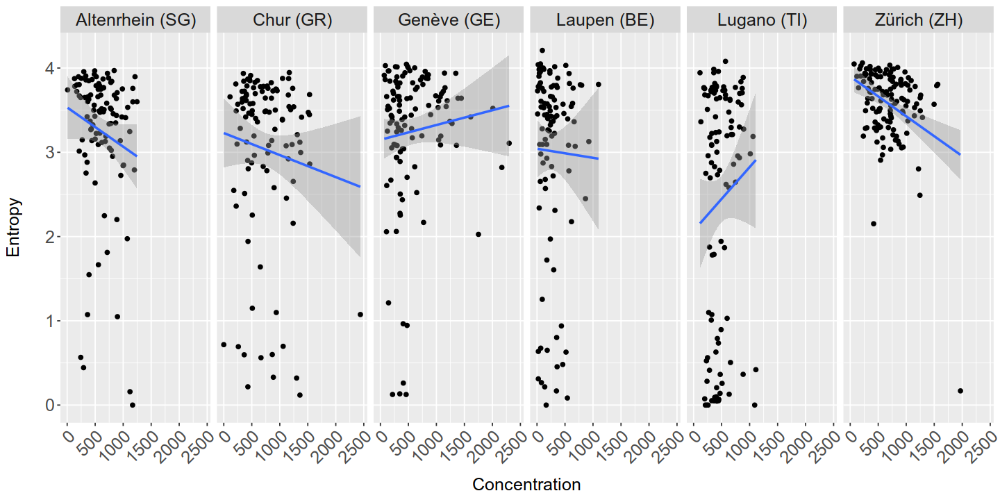

In [41]:
#dt_merge_entropy_viral_no_outlier <- dt_merge_entropy_viral%>%filter(!(location == "Zürich (ZH)" & entropy < 0.5))
options(repr.plot.width=12, repr.plot.height=6)
number = 15

ggplot(dt_merge_entropy_viral, aes(x = concentration_mean, y = entropy)) + 
    geom_point() + facet_wrap(~location, ncol=6)+ labs(x = "Concentration", y = "Entropy") + geom_smooth(method="lm") +
    theme(axis.text.x=element_text(angle = 45, hjust = 1, size=number), axis.text.y = element_text(size = number), 
    axis.title.x = element_text(size = number, margin = margin(t=10)), axis.title.y = element_text(size = number, margin = margin(r=20)),
    strip.text = element_text(size = number))

ggsave("entropy_concentration.pdf", path="FinalReport/figures", width = 12, height = 4)



In [42]:
#Let us make a datatable that contains coverage and concentration
dt_merge_coverage_100_viral  <- merge(coverage_threshold100,dt_viral, by = c("date", "location"))
dt_merge_coverage_200_viral  <- merge(coverage_threshold200,dt_viral, by = c("date", "location"))
dt_merge_coverage_1000_viral  <- merge(coverage_threshold1000,dt_viral, by = c("date", "location"))



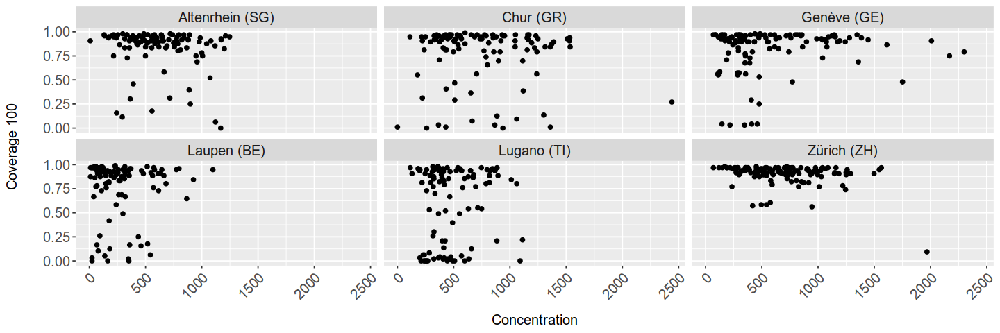

`geom_smooth()` using formula = 'y ~ x'

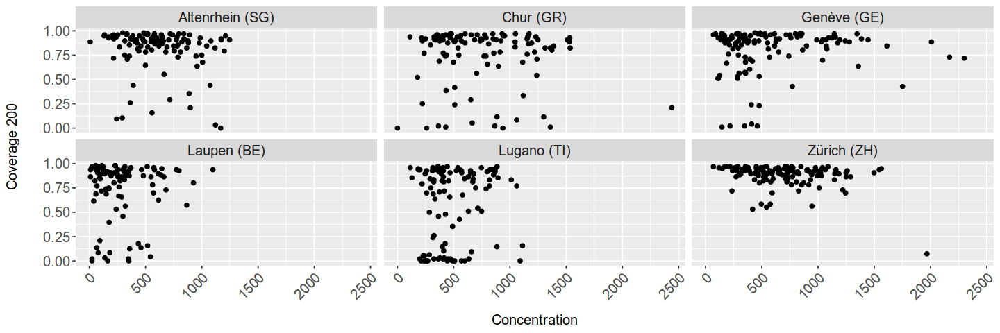

`geom_smooth()` using formula = 'y ~ x'

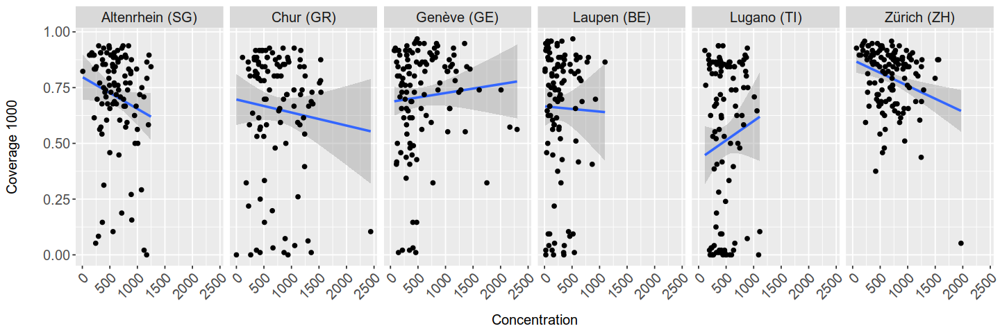

In [43]:
options(repr.plot.width=12, repr.plot.height=4)
number = 12

ggplot(dt_merge_coverage_100_viral, aes(x = concentration_mean, y = coverage)) + 
    geom_point() + facet_wrap(~location)+ labs(x = "Concentration", y = "Coverage 100") + 
    theme(axis.text.x=element_text(angle = 45, hjust = 1, size=number), axis.text.y = element_text(size = number), 
    axis.title.x = element_text(size = number, margin = margin(t=10)), axis.title.y = element_text(size = number, margin = margin(r=20)),
    strip.text = element_text(size = number))

ggplot(dt_merge_coverage_200_viral, aes(x = concentration_mean, y = coverage)) + 
    geom_point() + facet_wrap(~location)+ labs(x = "Concentration", y = "Coverage 200") + 
    theme(axis.text.x=element_text(angle = 45, hjust = 1, size=number), axis.text.y = element_text(size = number), 
    axis.title.x = element_text(size = number, margin = margin(t=10)), axis.title.y = element_text(size = number, margin = margin(r=20)),
    strip.text = element_text(size = number))

ggplot(dt_merge_coverage_1000_viral, aes(x = concentration_mean, y = coverage)) + geom_smooth(method ="lm")+
    geom_point() + facet_wrap(~location, ncol=6)+ labs(x = "Concentration", y = "Coverage 1000") + 
    theme(axis.text.x=element_text(angle = 45, hjust = 1, size=number), axis.text.y = element_text(size = number), 
    axis.title.x = element_text(size = number, margin = margin(t=10)), axis.title.y = element_text(size = number, margin = margin(r=20)),
    strip.text = element_text(size = number))

ggsave("coverage1000_concentration.pdf", path="FinalReport/figures", width = 12, height = 4)


# Linear models

In [44]:
#create data table that combines entropy, delay and concentrations
model_entropy_concentration <- merge(sum_entropy_distinct,dt_viral, by = c("date", "location"))

#now let us separate this datatable according to locations
model_entropy_concentration_chur <- model_entropy_concentration %>% filter(location == 'Chur (GR)')%>%
  arrange(date) %>% mutate(running_average = rollapply(concentration_mean, width = 7, 
                FUN = mean, fill = NA, align = 'right'))  %>%
                mutate(running_average = if_else(is.na(running_average), concentration_mean, running_average))

model_entropy_concentration_geneve <- model_entropy_concentration %>% filter(location == 'Genève (GE)')%>%
  arrange(date) %>% mutate(running_average = rollapply(concentration_mean, width = 6, 
                FUN = mean, fill = NA, align = 'right'))  %>%
                mutate(running_average = if_else(is.na(running_average), concentration_mean, running_average))

model_entropy_concentration_lugano <- model_entropy_concentration %>% filter(location == 'Lugano (TI)')%>%
  arrange(date) %>% mutate(running_average = rollapply(concentration_mean, width = 6, 
                FUN = mean, fill = NA, align = 'right'))  %>%
                mutate(running_average = if_else(is.na(running_average), concentration_mean, running_average))

model_entropy_concentration_altenrhein <- model_entropy_concentration %>% filter(location == 'Altenrhein (SG)')%>%
  arrange(date) %>% mutate(running_average = rollapply(concentration_mean, width = 7, 
                FUN = mean, fill = NA, align = 'right'))  %>%
                mutate(running_average = if_else(is.na(running_average), concentration_mean, running_average))

model_entropy_concentration_laupen <- model_entropy_concentration %>% filter(location == 'Laupen (BE)')%>%
  arrange(date) %>% mutate(running_average = rollapply(concentration_mean, width = 7, 
                FUN = mean, fill = NA, align = 'right'))  %>%
                mutate(running_average = if_else(is.na(running_average), concentration_mean, running_average))

model_entropy_concentration_zurich <- model_entropy_concentration %>% filter(location == 'Zürich (ZH)')%>%
  arrange(date) %>% mutate(running_average = rollapply(concentration_mean, width = 6, 
                FUN = mean, fill = NA, align = 'right'))  %>%
                mutate(running_average = if_else(is.na(running_average), concentration_mean, running_average))


#separate the data containing only entropy and delay according to locations
sum_entropy_chur <- sum_entropy %>% filter(location == 'Chur (GR)')
sum_entropy_geneve <- sum_entropy %>% filter(location == 'Genève (GE)')
sum_entropy_lugano <- sum_entropy %>% filter(location == 'Lugano (TI)')
sum_entropy_altenrhein <- sum_entropy %>% filter(location == 'Altenrhein (SG)')
sum_entropy_laupen <- sum_entropy %>% filter(location == 'Laupen (BE)')
sum_entropy_zurich <- sum_entropy %>% filter(location == 'Zürich (ZH)')

#remove the duplicates in order to get the correct p-values
sum_entropy_chur <- sum_entropy_chur %>% distinct(date, .keep_all = TRUE) %>%
  dplyr::select(-amplicon, -depth, -sample_day, -test_day, -sum, -sum_norm, -product)

sum_entropy_geneve <- sum_entropy_geneve %>% distinct(date, .keep_all = TRUE) %>%
  dplyr::select(-amplicon, -depth, -sample_day, -test_day, -sum, -sum_norm, -product)

sum_entropy_lugano <- sum_entropy_lugano %>% distinct(date, .keep_all = TRUE) %>%
  dplyr::select(-amplicon, -depth, -sample_day, -test_day, -sum, -sum_norm, -product)

sum_entropy_altenrhein <- sum_entropy_altenrhein %>% distinct(date, .keep_all = TRUE) %>%
  dplyr::select(-amplicon,-depth,-sample_day,-test_day, -sum, -sum_norm, -product)

sum_entropy_laupen <- sum_entropy_laupen %>% distinct(date, .keep_all = TRUE) %>%
  dplyr::select(-amplicon, -depth, -sample_day, -test_day, -sum, -sum_norm, -product)

sum_entropy_zurich <- sum_entropy_zurich %>% distinct(date, .keep_all = TRUE) %>%
  dplyr::select(-amplicon, -depth, -sample_day, -test_day, -sum, -sum_norm, -product)

#--------------------------------------------------------------------------------------------------------------------------

#create data table that combines coverage_100, delay and concentrations
model_coverage_100_concentration <- merge(coverage_model_100,dt_viral, by = c("date", "location"))

#separate this datatable according to locations
model_coverage_100_concentration_chur <- model_coverage_100_concentration %>% filter(location == 'Chur (GR)')%>%
  arrange(date) %>% mutate(running_average = rollapply(concentration_mean, width = 6, 
                FUN = mean, fill = NA, align = 'right'))  %>%
                mutate(running_average = if_else(is.na(running_average), concentration_mean, running_average))

model_coverage_100_concentration_geneve <- model_coverage_100_concentration %>% filter(location == 'Genève (GE)')%>%
  arrange(date) %>% mutate(running_average = rollapply(concentration_mean, width = 6, 
                FUN = mean, fill = NA, align = 'right'))  %>%
                mutate(running_average = if_else(is.na(running_average), concentration_mean, running_average))

model_coverage_100_concentration_lugano <- model_coverage_100_concentration %>% filter(location == 'Lugano (TI)')%>%
  arrange(date) %>% mutate(running_average = rollapply(concentration_mean, width = 6, 
                FUN = mean, fill = NA, align = 'right'))  %>%
                mutate(running_average = if_else(is.na(running_average), concentration_mean, running_average))

model_coverage_100_concentration_altenrhein <- model_coverage_100_concentration %>% filter(location == 'Altenrhein (SG)')%>%
  arrange(date) %>% mutate(running_average = rollapply(concentration_mean, width = 6, 
                FUN = mean, fill = NA, align = 'right'))  %>%
                mutate(running_average = if_else(is.na(running_average), concentration_mean, running_average))

model_coverage_100_concentration_laupen <- model_coverage_100_concentration %>% filter(location == 'Laupen (BE)')%>%
  arrange(date) %>% mutate(running_average = rollapply(concentration_mean, width = 6, 
                FUN = mean, fill = NA, align = 'right'))  %>%
                mutate(running_average = if_else(is.na(running_average), concentration_mean, running_average))

model_coverage_100_concentration_zurich <- model_coverage_100_concentration %>% filter(location == 'Zürich (ZH)')%>%
  arrange(date) %>% mutate(running_average = rollapply(concentration_mean, width = 6, 
                FUN = mean, fill = NA, align = 'right'))  %>%
                mutate(running_average = if_else(is.na(running_average), concentration_mean, running_average))


#create data table that combines coverage_200, delay and concentrations
model_coverage_200_concentration <- merge(coverage_model_200,dt_viral, by = c("date", "location"))

#separate this datatable according to locations
model_coverage_200_concentration_chur <- model_coverage_200_concentration %>% filter(location == 'Chur (GR)')%>%
  arrange(date) %>% mutate(running_average = rollapply(concentration_mean, width = 6, 
                FUN = mean, fill = NA, align = 'right'))  %>%
                mutate(running_average = if_else(is.na(running_average), concentration_mean, running_average))

model_coverage_200_concentration_geneve <- model_coverage_200_concentration %>% filter(location == 'Genève (GE)')%>%
  arrange(date) %>% mutate(running_average = rollapply(concentration_mean, width = 6, 
                FUN = mean, fill = NA, align = 'right'))  %>%
                mutate(running_average = if_else(is.na(running_average), concentration_mean, running_average))

model_coverage_200_concentration_lugano <- model_coverage_200_concentration %>% filter(location == 'Lugano (TI)')%>%
  arrange(date) %>% mutate(running_average = rollapply(concentration_mean, width = 6, 
                FUN = mean, fill = NA, align = 'right'))  %>%
                mutate(running_average = if_else(is.na(running_average), concentration_mean, running_average))

model_coverage_200_concentration_altenrhein <- model_coverage_200_concentration %>% filter(location == 'Altenrhein (SG)')%>%
  arrange(date) %>% mutate(running_average = rollapply(concentration_mean, width = 6, 
                FUN = mean, fill = NA, align = 'right'))  %>%
                mutate(running_average = if_else(is.na(running_average), concentration_mean, running_average))

model_coverage_200_concentration_laupen <- model_coverage_200_concentration %>% filter(location == 'Laupen (BE)')%>%
  arrange(date) %>% mutate(running_average = rollapply(concentration_mean, width = 6, 
                FUN = mean, fill = NA, align = 'right'))  %>%
                mutate(running_average = if_else(is.na(running_average), concentration_mean, running_average))

model_coverage_200_concentration_zurich <- model_coverage_200_concentration %>% filter(location == 'Zürich (ZH)')%>%
  arrange(date) %>% mutate(running_average = rollapply(concentration_mean, width = 6, 
                FUN = mean, fill = NA, align = 'right'))  %>%
                mutate(running_average = if_else(is.na(running_average), concentration_mean, running_average))

#create data table that combines coverage_1000, delay and concentrations
model_coverage_1000_concentration <- merge(coverage_model_1000,dt_viral, by = c("date", "location"))

#separate this datatable according to locations
model_coverage_1000_concentration_chur <- model_coverage_1000_concentration %>% filter(location == 'Chur (GR)')%>%
  arrange(date) %>% mutate(running_average = rollapply(concentration_mean, width = 6, 
                FUN = mean, fill = NA, align = 'right'))  %>%
                mutate(running_average = if_else(is.na(running_average), concentration_mean, running_average))

model_coverage_1000_concentration_geneve <- model_coverage_1000_concentration %>% filter(location == 'Genève (GE)')%>%
  arrange(date) %>% mutate(running_average = rollapply(concentration_mean, width = 6, 
                FUN = mean, fill = NA, align = 'right'))  %>%
                mutate(running_average = if_else(is.na(running_average), concentration_mean, running_average))

model_coverage_1000_concentration_lugano <- model_coverage_1000_concentration %>% filter(location == 'Lugano (TI)')%>%
  arrange(date) %>% mutate(running_average = rollapply(concentration_mean, width = 6, 
                FUN = mean, fill = NA, align = 'right'))  %>%
                mutate(running_average = if_else(is.na(running_average), concentration_mean, running_average))

model_coverage_1000_concentration_altenrhein <- model_coverage_1000_concentration %>% filter(location == 'Altenrhein (SG)')%>%
  arrange(date) %>% mutate(running_average = rollapply(concentration_mean, width = 6, 
                FUN = mean, fill = NA, align = 'right'))  %>%
                mutate(running_average = if_else(is.na(running_average), concentration_mean, running_average))

model_coverage_1000_concentration_laupen <- model_coverage_1000_concentration %>% filter(location == 'Laupen (BE)')%>%
  arrange(date) %>% mutate(running_average = rollapply(concentration_mean, width = 6, 
                FUN = mean, fill = NA, align = 'right'))  %>%
                mutate(running_average = if_else(is.na(running_average), concentration_mean, running_average))

model_coverage_1000_concentration_zurich <- model_coverage_1000_concentration %>% filter(location == 'Zürich (ZH)')%>%
  arrange(date) %>% mutate(running_average = rollapply(concentration_mean, width = 6, 
                FUN = mean, fill = NA, align = 'right'))  %>%
                mutate(running_average = if_else(is.na(running_average), concentration_mean, running_average))


#datatable containing only coverage and delay per location
coverage_model_100_chur <- coverage_model_100 %>% filter(location == 'Chur (GR)')
coverage_model_100_geneve <- coverage_model_100 %>% filter(location == 'Genève (GE)')
coverage_model_100_lugano <- coverage_model_100 %>% filter(location == 'Lugano (TI)')
coverage_model_100_altenrhein <- coverage_model_100 %>% filter(location == 'Altenrhein (SG)')
coverage_model_100_laupen <- coverage_model_100 %>% filter(location == 'Laupen (BE)')
coverage_model_100_zurich <- coverage_model_100 %>% filter(location == 'Zürich (ZH)')

coverage_model_200_chur <- coverage_model_200 %>% filter(location == 'Chur (GR)')
coverage_model_200_geneve <- coverage_model_200 %>% filter(location == 'Genève (GE)')
coverage_model_200_lugano <- coverage_model_200 %>% filter(location == 'Lugano (TI)')
coverage_model_200_altenrhein <- coverage_model_200 %>% filter(location == 'Altenrhein (SG)')
coverage_model_200_laupen <- coverage_model_200 %>% filter(location == 'Laupen (BE)')
coverage_model_200_zurich <- coverage_model_200 %>% filter(location == 'Zürich (ZH)')

coverage_model_1000_chur <- coverage_model_1000 %>% filter(location == 'Chur (GR)')
coverage_model_1000_geneve <- coverage_model_1000 %>% filter(location == 'Genève (GE)')
coverage_model_1000_lugano <- coverage_model_1000 %>% filter(location == 'Lugano (TI)')
coverage_model_1000_altenrhein <- coverage_model_1000 %>% filter(location == 'Altenrhein (SG)')
coverage_model_1000_laupen <- coverage_model_1000 %>% filter(location == 'Laupen (BE)')
coverage_model_1000_zurich <- coverage_model_1000 %>% filter(location == 'Zürich (ZH)')

In [45]:
tail(model_entropy_concentration_chur)

,date,location,amplicon,depth,sample_day,test_day,delay,sum,sum_norm,product,entropy,measurement_type,concentration_mean,running_average
101,2023-03-28,Chur (GR),X0,276,2,3,2,4641908,5.945831e-05,0.0005785433,3.696674,SN2_gc_per_mL_WW,561.5635,455.6073
102,2023-03-30,Chur (GR),X0,49,4,3,6,594787,8.238243e-05,0.0007747358,2.360991,SN2_gc_per_mL_WW,221.3985,414.4256
103,2023-04-01,Chur (GR),X0,478,6,3,4,8638310,5.533489e-05,0.0005423985,3.615237,SN2_gc_per_mL_WW,399.8954,413.4707
104,2023-04-02,Chur (GR),X0,352,7,3,3,8268742,4.256996e-05,0.0004284395,3.647614,SN2_gc_per_mL_WW,375.7407,366.6040
105,2023-04-03,Chur (GR),X0,394,1,3,3,9101855,4.328788e-05,0.0004349409,3.723379,SN2_gc_per_mL_WW,326.7804,364.0223
106,2023-04-04,Chur (GR),X0,334,2,3,2,7963826,4.193964e-05,0.0004227213,3.464345,SN2_gc_per_mL_WW,446.6327,368.7821


# Linear regression
We will now fit the linear regression model for all locations


Call:
lm(formula = exp(entropy) ~ delay, data = sum_entropy_chur)

Residuals:
    Min      1Q  Median      3Q     Max 
-30.234  -7.868   1.836   9.109  30.987 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)  39.6224     1.6650  23.798  < 2e-16 ***
delay        -2.4601     0.3618  -6.799 3.84e-11 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 12.06 on 400 degrees of freedom
Multiple R-squared:  0.1036,	Adjusted R-squared:  0.1014 
F-statistic: 46.23 on 1 and 400 DF,  p-value: 3.837e-11


,2.5 %,97.5 %
(Intercept),36.349273,42.895625
delay,-3.171338,-1.748776



Call:
lm(formula = exp(entropy) ~ delay, data = sum_entropy_geneve)

Residuals:
    Min      1Q  Median      3Q     Max 
-31.796  -7.999   2.122   9.412  27.943 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)  26.7578     1.9283  13.876   <2e-16 ***
delay         1.0898     0.5029   2.167   0.0308 *  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 13.94 on 391 degrees of freedom
Multiple R-squared:  0.01187,	Adjusted R-squared:  0.009339 
F-statistic: 4.695 on 1 and 391 DF,  p-value: 0.03085


,2.5 %,97.5 %
(Intercept),22.9666107,30.548921
delay,0.1009987,2.078636



Call:
lm(formula = exp(entropy) ~ delay, data = sum_entropy_altenrhein)

Residuals:
    Min      1Q  Median      3Q     Max 
-30.086  -7.231   1.349   9.515  23.890 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) 30.57996    1.74502   17.52   <2e-16 ***
delay        0.07232    0.37974    0.19    0.849    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 12.68 on 402 degrees of freedom
Multiple R-squared:  9.022e-05,	Adjusted R-squared:  -0.002397 
F-statistic: 0.03627 on 1 and 402 DF,  p-value: 0.8491


,2.5 %,97.5 %
(Intercept),27.1494664,34.0104631
delay,-0.6742094,0.8188529



Call:
lm(formula = exp(entropy) ~ delay, data = sum_entropy_lugano)

Residuals:
    Min      1Q  Median      3Q     Max 
-30.432 -11.340   3.207  11.893  30.805 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)  26.7498     2.1144  12.651   <2e-16 ***
delay         0.7804     0.5504   1.418    0.157    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 15.5 on 402 degrees of freedom
Multiple R-squared:  0.004975,	Adjusted R-squared:  0.0025 
F-statistic:  2.01 on 1 and 402 DF,  p-value: 0.157


,2.5 %,97.5 %
(Intercept),22.5931426,30.906458
delay,-0.3017159,1.862524



Call:
lm(formula = exp(entropy) ~ delay, data = sum_entropy_laupen)

Residuals:
    Min      1Q  Median      3Q     Max 
-29.736 -10.956   2.633  11.809  37.080 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)  27.1061     2.2242  12.187   <2e-16 ***
delay         0.5186     0.4840   1.071    0.285    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 16.16 on 402 degrees of freedom
Multiple R-squared:  0.002847,	Adjusted R-squared:  0.000367 
F-statistic: 1.148 on 1 and 402 DF,  p-value: 0.2846


,2.5 %,97.5 %
(Intercept),22.7336149,31.478631
delay,-0.4329386,1.470116



Call:
lm(formula = exp(entropy) ~ delay, data = sum_entropy_zurich)

Residuals:
    Min      1Q  Median      3Q     Max 
-34.751  -7.465   1.326   8.118  22.220 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)  36.6043     1.5189   24.10   <2e-16 ***
delay        -0.3881     0.3960   -0.98    0.328    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 11.17 on 404 degrees of freedom
Multiple R-squared:  0.002373,	Adjusted R-squared:  -9.66e-05 
F-statistic: 0.9609 on 1 and 404 DF,  p-value: 0.3276


,2.5 %,97.5 %
(Intercept),33.618383,39.5902238
delay,-1.166554,0.3902672


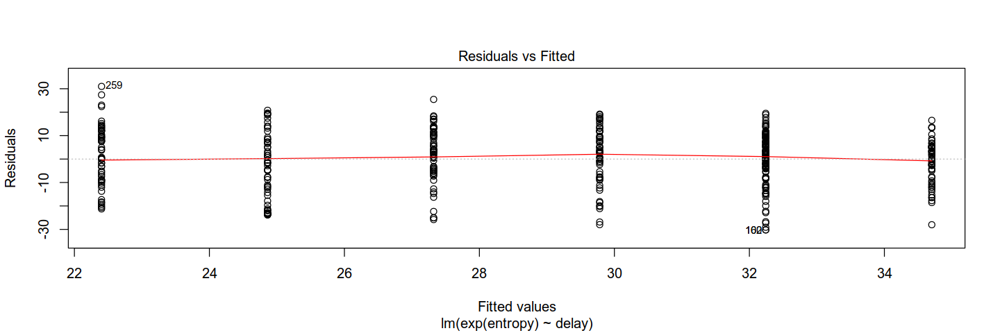

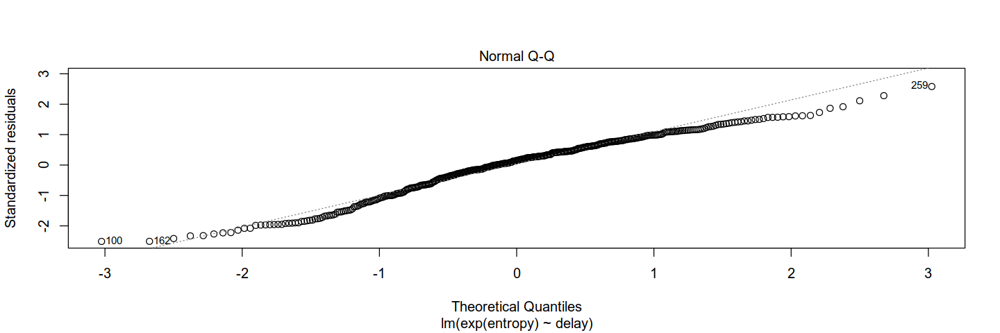

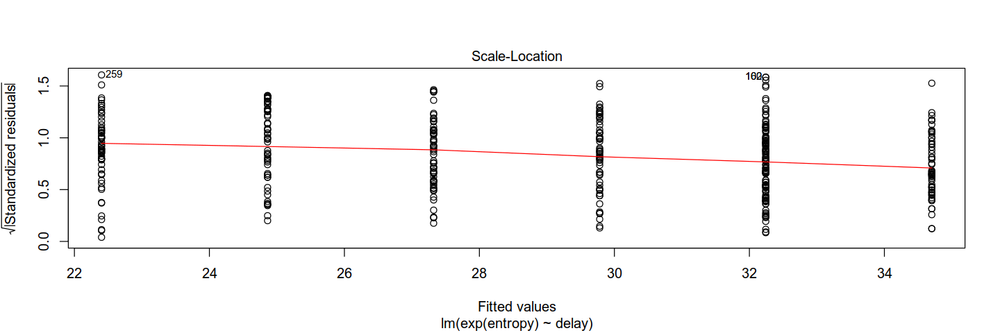

png 
  2

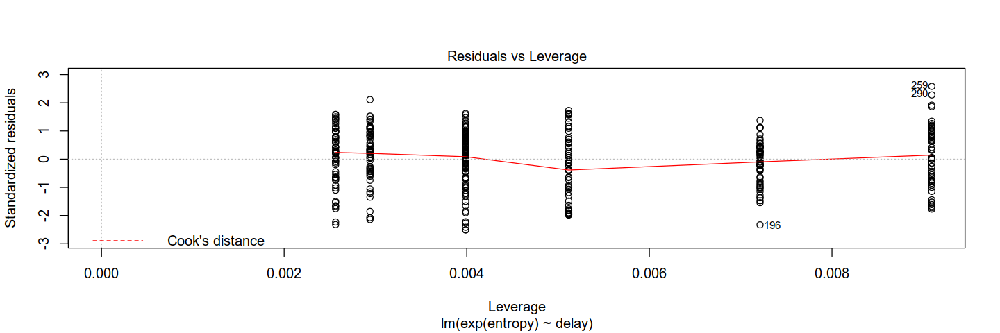

In [46]:
#regressions exp(entropy) vs delay
lm_chur <- lm(exp(entropy) ~ delay, data = sum_entropy_chur)
summary(lm_chur)
confint(lm_chur)

lm_geneve <- lm(exp(entropy) ~ delay, data = sum_entropy_geneve)
summary(lm_geneve)
confint(lm_geneve)

lm_altenrhein <- lm(exp(entropy) ~ delay, data = sum_entropy_altenrhein)
summary(lm_altenrhein)
confint(lm_altenrhein)

lm_lugano <- lm(exp(entropy) ~ delay, data = sum_entropy_lugano)
summary(lm_lugano)
confint(lm_lugano)

lm_laupen <- lm(exp(entropy) ~ delay, data = sum_entropy_laupen)
summary(lm_laupen)
confint(lm_laupen)

lm_zurich <- lm(exp(entropy) ~ delay, data = sum_entropy_zurich)
summary(lm_zurich)
confint(lm_zurich)

plot(lm_chur)

#plot residuals against time to verify the assumption of uncorrelated errors
cairo_ps(file = "FinalReport/figures/uncorrelated_errors_assumption1.eps", width = 12, height = 6)

plot(residuals(lm_chur) ~ sum_entropy_chur$date, xlab="Date", ylab="Residuals", cex.lab = 1.7, cex.axis =1.5, xaxt = "n")
# Add a custom x-axis with more date labels
axis.Date(1, 
          at = seq(min(sum_entropy_chur$date), max(sum_entropy_chur$date), by = "2 month"), 
          format = "%b %Y", 
          cex.axis = 1.7)
abline(h=0)

dev.off()

In [47]:
#diagnostic plots for chur
options(repr.plot.width=6, repr.plot.height=4)

#define the two most frequent diagnostic plots
number= 25
residuals_fitted <- autoplot(lm_chur, which =1) + theme(
    plot.title = element_text(size = number),
    axis.title.x = element_text(size = number),  
    axis.title.y = element_text(size = number),  
    axis.text.x = element_text(size = number),   
    axis.text.y = element_text(size = number)    
  )

qq_plot <- autoplot(lm_chur, which =2) + theme(
    plot.title = element_text(size = number),
    axis.title.x = element_text(size = number),  
    axis.title.y = element_text(size = number), 
    axis.text.x = element_text(size = number),  
    axis.text.y = element_text(size = number)    
  )

cairo_ps(file = "FinalReport/figures/combined_plot.eps", width = 12, height = 6)

#combine them in one plot 
combined_plot <- residuals_fitted + qq_plot 
print(combined_plot)

dev.off()


png 
  2

`geom_smooth()` using formula = 'y ~ x'Saving 6.67 x 6.67 in image`geom_smooth()` using formula = 'y ~ x'

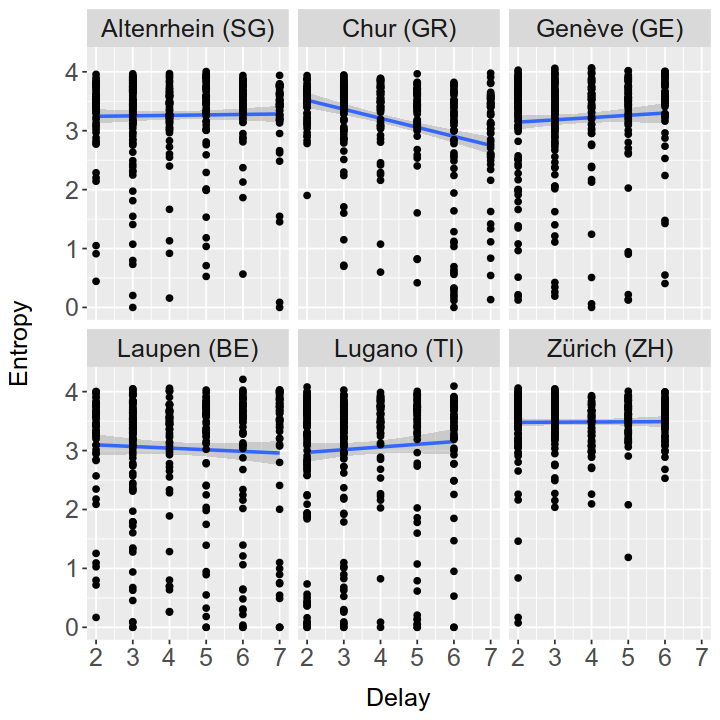

In [48]:
#plot the results for all locations
options(repr.plot.width=6, repr.plot.height=6)
number=15
ggplot(sum_entropy_distinct, aes(x = delay, y = entropy)) + geom_smooth(method ="lm")+
    geom_point() + facet_wrap(~location)+ labs(x = "Delay", y = "Entropy") + 
    theme(axis.text.x=element_text(size=number), axis.text.y = element_text(size = number), 
    axis.title.x = element_text(size = number, margin = margin(t=10)), axis.title.y = element_text(size = number, margin = margin(r=20)),
    strip.text = element_text(size = number))

ggsave("lm_entropy_delay.pdf", path="FinalReport/figures")



### Only high entropy values

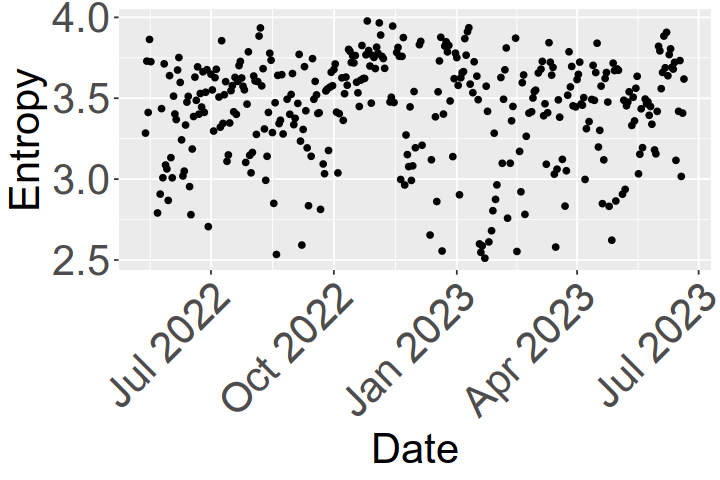

TableGrob (1 x 2) "arrange": 2 grobs
  z     cells    name           grob
1 1 (1-1,1-1) arrange gtable[layout]
2 2 (1-1,2-2) arrange gtable[layout]


png 
  2


Call:
lm(formula = entropy ~ delay, data = sum_entropy_high_chur)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.97718 -0.17610  0.06485  0.23365  0.67709 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)  3.62895    0.04588   79.09  < 2e-16 ***
delay       -0.04692    0.01031   -4.55 7.41e-06 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.3167 on 349 degrees of freedom
Multiple R-squared:  0.056,	Adjusted R-squared:  0.0533 
F-statistic: 20.71 on 1 and 349 DF,  p-value: 7.405e-06


,2.5 %,97.5 %
(Intercept),3.53871030,3.71919403
delay,-0.06719944,-0.02663932


png 
  2

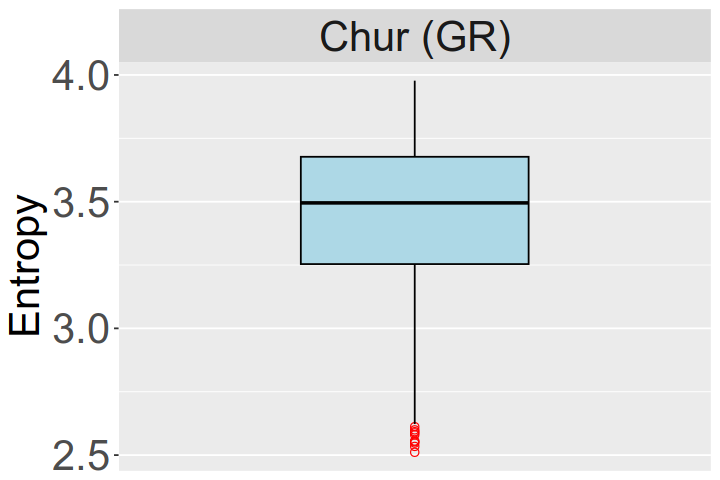

In [60]:
#Trying a model with only high entropy values
#define the data
sum_entropy_high_chur <- sum_entropy_chur %>% filter(entropy > 2.5)

#plot the scatter plot of the data
options(repr.plot.width=6, repr.plot.height=4)
number = 25
plot_chur_high <- sum_entropy_high_chur %>%  ggplot(aes(date, entropy)) + geom_point() + 
                    theme(axis.text.x = element_text(angle = 45, hjust = 1, size = number), axis.text.y = element_text(size = number), 
                  axis.title.x = element_text(size = number), axis.title.y = element_text(size = number),strip.text = element_text(size = number)) +
                  xlab("Date") + ylab("Entropy")
print(plot_chur_high)

#plot the boxplot of data
boxplot_chur_high <- ggplot(sum_entropy_high_chur, aes(y = entropy)) +
  geom_boxplot(fill = "lightblue", color = "black", outlier.colour="red", outlier.shape=1,
             outlier.size=2, notch=FALSE) +
              labs(y = "Entropy") + facet_wrap(~location)+
              theme(axis.text.y = element_text(size = 25), 
           axis.title.y = element_text(size = 25), strip.text = element_text(size = 25)) + scale_x_discrete()

print(boxplot_chur_high)

#combine the two plots together
cairo_ps(file = "FinalReport/figures/combined_plots_chur_high.eps", width=12, height = 6)
combined_plots_chur_high <- grid.arrange(plot_chur_high, boxplot_chur_high, ncol = 2)
print(combined_plots_chur_high)
dev.off()


#fit the linear model
lm_chur_high <- lm(entropy ~ delay, data = sum_entropy_high_chur)
summary(lm_chur_high)
confint(lm_chur_high)


#plot the diagnostic plots
residuals_fitted_high <- autoplot(lm_chur_high, which =1) + theme(
    plot.title = element_text(size = number),
    axis.title.x = element_text(size = number),  
    axis.title.y = element_text(size = number),  
    axis.text.x = element_text(size = number),   
    axis.text.y = element_text(size = number),
    plot.margin = margin(t = 0.5, r = 0.5, b = 0.5, l = 0.5, unit = "cm") 
  )

qq_plot_high <- autoplot(lm_chur_high, which =2) + theme(
    plot.title = element_text(size = number),
   axis.title.x = element_text(size = number),  
    axis.title.y = element_text(size = number), 
    axis.text.x = element_text(size = number),  
    axis.text.y = element_text(size = number)    
  )

cairo_ps(file = "FinalReport/figures/combined_plot_high_chur.eps", width=12, height = 6)

#combine them in one plot 
combined_plot_high_chur <- residuals_fitted_high + qq_plot_high 
print(combined_plot_high_chur)

dev.off()



## Coverage vs. delay linear regression models


In [50]:
lm_chur_coverage_100 <- lm(coverage ~ delay, data = coverage_model_100_chur)
summary(lm_chur_coverage_100)
confint(lm_chur_coverage_100)

lm_chur_coverage_200 <- lm(coverage ~ delay, data = coverage_model_200_chur)
summary(lm_chur_coverage_200)
confint(lm_chur_coverage_200)

lm_chur_coverage_1000 <- lm(coverage ~ delay, data = coverage_model_1000_chur)
summary(lm_chur_coverage_1000)
confint(lm_chur_coverage_1000)




Call:
lm(formula = coverage ~ delay, data = coverage_model_100_chur)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.84301 -0.02254  0.06324  0.13727  0.30410 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)  0.995009   0.031900  31.191  < 2e-16 ***
delay       -0.047194   0.006932  -6.808 3.63e-11 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.2311 on 400 degrees of freedom
Multiple R-squared:  0.1038,	Adjusted R-squared:  0.1016 
F-statistic: 46.35 on 1 and 400 DF,  p-value: 3.635e-11


,2.5 %,97.5 %
(Intercept),0.93229571,1.05772129
delay,-0.06082212,-0.03356639



Call:
lm(formula = coverage ~ delay, data = coverage_model_200_chur)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.82623 -0.04498  0.06960  0.14422  0.32301 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)  0.969414   0.032530  29.801  < 2e-16 ***
delay       -0.047727   0.007069  -6.752 5.16e-11 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.2356 on 400 degrees of freedom
Multiple R-squared:  0.1023,	Adjusted R-squared:  0.1001 
F-statistic: 45.59 on 1 and 400 DF,  p-value: 5.157e-11


,2.5 %,97.5 %
(Intercept),0.90546355,1.03336411
delay,-0.06162395,-0.03383039



Call:
lm(formula = coverage ~ delay, data = coverage_model_1000_chur)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.72525 -0.08983  0.06121  0.15610  0.37078 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)  0.867585   0.032136  26.998  < 2e-16 ***
delay       -0.047445   0.006983  -6.794 3.97e-11 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.2328 on 400 degrees of freedom
Multiple R-squared:  0.1035,	Adjusted R-squared:  0.1012 
F-statistic: 46.16 on 1 and 400 DF,  p-value: 3.966e-11


,2.5 %,97.5 %
(Intercept),0.80440921,0.93076076
delay,-0.06117316,-0.03371621


In [51]:
lm_geneve_coverage_100 <- lm(coverage ~ delay, data = coverage_model_100_geneve)
summary(lm_geneve_coverage_100)
confint(lm_geneve_coverage_100)

lm_geneve_coverage_200 <- lm(coverage ~ delay, data = coverage_model_200_geneve)
summary(lm_geneve_coverage_200)
confint(lm_geneve_coverage_200)

lm_geneve_coverage_1000 <- lm(coverage ~ delay, data = coverage_model_1000_geneve)
summary(lm_geneve_coverage_1000)
confint(lm_geneve_coverage_1000)



Call:
lm(formula = coverage ~ delay, data = coverage_model_100_geneve)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.81289 -0.00411  0.09336  0.13131  0.17966 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) 0.786119   0.032325  24.319   <2e-16 ***
delay       0.006692   0.008431   0.794    0.428    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.2337 on 391 degrees of freedom
Multiple R-squared:  0.001609,	Adjusted R-squared:  -0.0009449 
F-statistic:  0.63 on 1 and 391 DF,  p-value: 0.4279


,2.5 %,97.5 %
(Intercept),0.722566372,0.84967193
delay,-0.009884259,0.02326773



Call:
lm(formula = coverage ~ delay, data = coverage_model_200_geneve)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.78699 -0.02823  0.09843  0.13926  0.20094 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) 0.748637   0.033081  22.630   <2e-16 ***
delay       0.009588   0.008628   1.111    0.267    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.2392 on 391 degrees of freedom
Multiple R-squared:  0.003148,	Adjusted R-squared:  0.0005989 
F-statistic: 1.235 on 1 and 391 DF,  p-value: 0.2671


,2.5 %,97.5 %
(Intercept),0.683596998,0.81367616
delay,-0.007375412,0.02655216



Call:
lm(formula = coverage ~ delay, data = coverage_model_1000_geneve)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.68985 -0.08568  0.06874  0.16861  0.28136 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) 0.626724   0.033532  18.690   <2e-16 ***
delay       0.014708   0.008746   1.682   0.0934 .  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.2424 on 391 degrees of freedom
Multiple R-squared:  0.007181,	Adjusted R-squared:  0.004642 
F-statistic: 2.828 on 1 and 391 DF,  p-value: 0.09343


,2.5 %,97.5 %
(Intercept),0.560798124,0.6926499
delay,-0.002487221,0.0319027


In [52]:
lm_lugano_coverage_100 <- lm(coverage ~ delay, data = coverage_model_100_lugano)
summary(lm_lugano_coverage_100)
confint(lm_lugano_coverage_100)

lm_lugano_coverage_200 <- lm(coverage ~ delay, data = coverage_model_200_lugano)
summary(lm_lugano_coverage_200)
confint(lm_lugano_coverage_200)

lm_lugano_coverage_1000 <- lm(coverage ~ delay, data = coverage_model_1000_lugano)
summary(lm_lugano_coverage_1000)
confint(lm_lugano_coverage_1000)



Call:
lm(formula = coverage ~ delay, data = coverage_model_100_lugano)

Residuals:
    Min      1Q  Median      3Q     Max 
-0.7851  0.0088  0.1357  0.1837  0.2257 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) 0.737710   0.040879  18.046   <2e-16 ***
delay       0.007898   0.010642   0.742    0.458    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.2996 on 402 degrees of freedom
Multiple R-squared:  0.001368,	Adjusted R-squared:  -0.001116 
F-statistic: 0.5508 on 1 and 402 DF,  p-value: 0.4584


,2.5 %,97.5 %
(Intercept),0.65734613,0.81807330
delay,-0.01302298,0.02881979



Call:
lm(formula = coverage ~ delay, data = coverage_model_200_lugano)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.76461 -0.02058  0.14061  0.19061  0.24166 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) 0.708332   0.041091  17.238   <2e-16 ***
delay       0.009379   0.010698   0.877    0.381    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.3012 on 402 degrees of freedom
Multiple R-squared:  0.001909,	Adjusted R-squared:  -0.0005743 
F-statistic: 0.7687 on 1 and 402 DF,  p-value: 0.3811


,2.5 %,97.5 %
(Intercept),0.62755058,0.78911258
delay,-0.01165096,0.03040915



Call:
lm(formula = coverage ~ delay, data = coverage_model_1000_lugano)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.67892 -0.08517  0.11450  0.21754  0.30226 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)  0.61341    0.03967  15.463   <2e-16 ***
delay        0.01092    0.01033   1.057    0.291    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.2908 on 402 degrees of freedom
Multiple R-squared:  0.002773,	Adjusted R-squared:  0.0002919 
F-statistic: 1.118 on 1 and 402 DF,  p-value: 0.2911


,2.5 %,97.5 %
(Intercept),0.535421503,0.69139547
delay,-0.009384528,0.03122082


In [53]:
lm_altenrhein_coverage_100 <- lm(coverage ~ delay, data = coverage_model_100_altenrhein)
summary(lm_altenrhein_coverage_100)
confint(lm_altenrhein_coverage_100)

lm_altenrhein_coverage_200 <- lm(coverage ~ delay, data = coverage_model_200_altenrhein)
summary(lm_altenrhein_coverage_200)
confint(lm_altenrhein_coverage_200)

lm_altenrhein_coverage_1000 <- lm(coverage ~ delay, data = coverage_model_1000_altenrhein)
summary(lm_altenrhein_coverage_1000)
confint(lm_altenrhein_coverage_1000)



Call:
lm(formula = coverage ~ delay, data = coverage_model_100_altenrhein)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.82708  0.00626  0.07351  0.11042  0.15371 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) 0.822222   0.028175  29.182   <2e-16 ***
delay       0.001618   0.006131   0.264    0.792    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.2047 on 402 degrees of freedom
Multiple R-squared:  0.0001733,	Adjusted R-squared:  -0.002314 
F-statistic: 0.06967 on 1 and 402 DF,  p-value: 0.792


,2.5 %,97.5 %
(Intercept),0.76683296,0.87761161
delay,-0.01043525,0.01367195



Call:
lm(formula = coverage ~ delay, data = coverage_model_200_altenrhein)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.79841 -0.00814  0.08144  0.11825  0.18214 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) 0.794242   0.029344  27.066   <2e-16 ***
delay       0.001391   0.006386   0.218    0.828    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.2132 on 402 degrees of freedom
Multiple R-squared:  0.000118,	Adjusted R-squared:  -0.002369 
F-statistic: 0.04744 on 1 and 402 DF,  p-value: 0.8277


,2.5 %,97.5 %
(Intercept),0.73655422,0.85192929
delay,-0.01116287,0.01394459



Call:
lm(formula = coverage ~ delay, data = coverage_model_1000_altenrhein)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.69602 -0.04636  0.05468  0.15954  0.25746 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) 0.686291   0.030578  22.444   <2e-16 ***
delay       0.001389   0.006654   0.209    0.835    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.2221 on 402 degrees of freedom
Multiple R-squared:  0.0001084,	Adjusted R-squared:  -0.002379 
F-statistic: 0.0436 on 1 and 402 DF,  p-value: 0.8347


,2.5 %,97.5 %
(Intercept),0.62617857,0.74640365
delay,-0.01169204,0.01447085


In [54]:
lm_zurich_coverage_100 <- lm(coverage ~ delay, data = coverage_model_100_zurich)
summary(lm_zurich_coverage_100)
confint(lm_zurich_coverage_100)

lm_zurich_coverage_200 <- lm(coverage ~ delay, data = coverage_model_200_zurich)
summary(lm_zurich_coverage_200)
confint(lm_zurich_coverage_200)

lm_zurich_coverage_1000 <- lm(coverage ~ delay, data = coverage_model_1000_zurich)
summary(lm_zurich_coverage_1000)
confint(lm_zurich_coverage_1000)



Call:
lm(formula = coverage ~ delay, data = coverage_model_100_zurich)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.87625  0.00472  0.04194  0.07167  0.11041 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)  0.898604   0.018748  47.931   <2e-16 ***
delay       -0.005970   0.004887  -1.221    0.223    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.1378 on 404 degrees of freedom
Multiple R-squared:  0.003679,	Adjusted R-squared:  0.001213 
F-statistic: 1.492 on 1 and 404 DF,  p-value: 0.2226


,2.5 %,97.5 %
(Intercept),0.86174838,0.935459622
delay,-0.01557778,0.003638272



Call:
lm(formula = coverage ~ delay, data = coverage_model_200_zurich)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.85082 -0.01518  0.04732  0.08262  0.13296 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)  0.873965   0.020197  43.271   <2e-16 ***
delay       -0.006363   0.005265  -1.208    0.228    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.1485 on 404 degrees of freedom
Multiple R-squared:  0.003601,	Adjusted R-squared:  0.001135 
F-statistic:  1.46 on 1 and 404 DF,  p-value: 0.2276


,2.5 %,97.5 %
(Intercept),0.83426059,0.913670294
delay,-0.01671342,0.003988179



Call:
lm(formula = coverage ~ delay, data = coverage_model_1000_zurich)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.74976 -0.07546  0.05432  0.12524  0.20016 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)  0.771591   0.023756  32.479   <2e-16 ***
delay       -0.005708   0.006193  -0.922    0.357    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.1747 on 404 degrees of freedom
Multiple R-squared:  0.002098,	Adjusted R-squared:  -0.000372 
F-statistic: 0.8494 on 1 and 404 DF,  p-value: 0.3573


,2.5 %,97.5 %
(Intercept),0.7248892,0.818292793
delay,-0.0178827,0.006467017


In [55]:
lm_laupen_coverage_100 <- lm(coverage ~ delay, data = coverage_model_100_laupen)
summary(lm_laupen_coverage_100)
confint(lm_laupen_coverage_100)

lm_laupen_coverage_200 <- lm(coverage ~ delay, data = coverage_model_200_laupen)
summary(lm_laupen_coverage_200)
confint(lm_laupen_coverage_200)

lm_laupen_coverage_1000 <- lm(coverage ~ delay, data = coverage_model_1000_laupen)
summary(lm_laupen_coverage_1000)
confint(lm_laupen_coverage_1000)



Call:
lm(formula = coverage ~ delay, data = coverage_model_100_laupen)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.78077 -0.01048  0.12548  0.17593  0.24176 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)  0.805472   0.039573  20.354   <2e-16 ***
delay       -0.008235   0.008612  -0.956     0.34    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.2875 on 402 degrees of freedom
Multiple R-squared:  0.002269,	Adjusted R-squared:  -0.0002125 
F-statistic: 0.9144 on 1 and 402 DF,  p-value: 0.3395


,2.5 %,97.5 %
(Intercept),0.72767589,0.883269064
delay,-0.02516469,0.008694867



Call:
lm(formula = coverage ~ delay, data = coverage_model_200_laupen)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.75276 -0.04358  0.12605  0.18474  0.25693 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)  0.775657   0.039917  19.432   <2e-16 ***
delay       -0.007631   0.008687  -0.878     0.38    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.29 on 402 degrees of freedom
Multiple R-squared:  0.001916,	Adjusted R-squared:  -0.0005667 
F-statistic: 0.7717 on 1 and 402 DF,  p-value: 0.3802


,2.5 %,97.5 %
(Intercept),0.69718489,0.854129998
delay,-0.02470793,0.009445824



Call:
lm(formula = coverage ~ delay, data = coverage_model_1000_laupen)

Residuals:
    Min      1Q  Median      3Q     Max 
-0.6487 -0.1195  0.1013  0.2161  0.3211 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)  0.657378   0.039800  16.517   <2e-16 ***
delay       -0.002881   0.008661  -0.333     0.74    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.2891 on 402 degrees of freedom
Multiple R-squared:  0.0002752,	Adjusted R-squared:  -0.002212 
F-statistic: 0.1106 on 1 and 402 DF,  p-value: 0.7396


,2.5 %,97.5 %
(Intercept),0.57913592,0.73562007
delay,-0.01990769,0.01414575


# Model with concentration


Call:
lm(formula = exp(entropy) ~ delay + running_average, data = model_entropy_concentration_chur)

Residuals:
    Min      1Q  Median      3Q     Max 
-30.479 -11.774   1.624   9.511  26.977 

Coefficients:
                 Estimate Std. Error t value Pr(>|t|)    
(Intercept)     43.743209   4.749525   9.210 4.22e-15 ***
delay           -5.354504   0.929657  -5.760 8.80e-08 ***
running_average  0.004930   0.003946   1.249    0.214    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 13 on 103 degrees of freedom
Multiple R-squared:  0.2555,	Adjusted R-squared:  0.241 
F-statistic: 17.67 on 2 and 103 DF,  p-value: 2.521e-07


,2.5 %,97.5 %
(Intercept),34.323645673,53.16277204
delay,-7.198259500,-3.51074776
running_average,-0.002896809,0.01275695



Call:
lm(formula = exp(entropy) ~ delay + running_average, data = model_entropy_concentration_geneve)

Residuals:
     Min       1Q   Median       3Q      Max 
-30.0199  -9.5488   0.5247  12.1840  26.5618 

Coefficients:
                 Estimate Std. Error t value Pr(>|t|)    
(Intercept)     28.514999   4.620421   6.172 1.06e-08 ***
delay           -0.240530   1.242532  -0.194   0.8468    
running_average  0.007303   0.003506   2.083   0.0395 *  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 14.99 on 114 degrees of freedom
Multiple R-squared:  0.03705,	Adjusted R-squared:  0.02016 
F-statistic: 2.193 on 2 and 114 DF,  p-value: 0.1162


,2.5 %,97.5 %
(Intercept),19.3619801308,37.6680177
delay,-2.7019755745,2.2209154
running_average,0.0003578972,0.0142479



Call:
lm(formula = exp(entropy) ~ delay + running_average, data = model_entropy_concentration_laupen)

Residuals:
    Min      1Q  Median      3Q     Max 
-31.286 -14.380   0.727  14.042  40.268 

Coefficients:
                 Estimate Std. Error t value Pr(>|t|)    
(Intercept)     37.008631   5.514770   6.711 1.07e-09 ***
delay           -1.434256   1.270441  -1.129    0.262    
running_average -0.006699   0.008434  -0.794    0.429    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 17.74 on 103 degrees of freedom
Multiple R-squared:  0.01723,	Adjusted R-squared:  -0.001854 
F-statistic: 0.9028 on 2 and 103 DF,  p-value: 0.4086


,2.5 %,97.5 %
(Intercept),26.0713853,47.94587747
delay,-3.9538756,1.08536267
running_average,-0.0234259,0.01002726



Call:
lm(formula = exp(entropy) ~ delay + running_average, data = model_entropy_concentration_zurich)

Residuals:
    Min      1Q  Median      3Q     Max 
-34.882  -8.374   1.045   9.695  18.680 

Coefficients:
                 Estimate Std. Error t value Pr(>|t|)    
(Intercept)     40.090977   3.974479  10.087   <2e-16 ***
delay            0.139736   0.935058   0.149    0.881    
running_average -0.003253   0.003691  -0.881    0.380    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 11.68 on 125 degrees of freedom
Multiple R-squared:  0.006339,	Adjusted R-squared:  -0.009559 
F-statistic: 0.3987 on 2 and 125 DF,  p-value: 0.672


,2.5 %,97.5 %
(Intercept),32.22498857,47.956964463
delay,-1.71086025,1.990331806
running_average,-0.01055845,0.004052642



Call:
lm(formula = exp(entropy) ~ delay + running_average, data = model_entropy_concentration_altenrhein)

Residuals:
    Min      1Q  Median      3Q     Max 
-31.660  -8.741   1.920  11.444  21.826 

Coefficients:
                 Estimate Std. Error t value Pr(>|t|)    
(Intercept)     28.598452   5.731767   4.989 2.47e-06 ***
delay            0.428959   1.005928   0.426    0.671    
running_average  0.002245   0.006865   0.327    0.744    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 14.07 on 103 degrees of freedom
Multiple R-squared:  0.002819,	Adjusted R-squared:  -0.01654 
F-statistic: 0.1456 on 2 and 103 DF,  p-value: 0.8647


,2.5 %,97.5 %
(Intercept),17.23084322,39.9660605
delay,-1.56606163,2.4239792
running_average,-0.01137035,0.0158605



Call:
lm(formula = exp(entropy) ~ delay + running_average, data = model_entropy_concentration_lugano)

Residuals:
    Min      1Q  Median      3Q     Max 
-28.426 -16.770  -1.534  16.950  37.398 

Coefficients:
                 Estimate Std. Error t value Pr(>|t|)  
(Intercept)     14.031287   6.864435   2.044   0.0435 *
delay           -0.202324   1.547464  -0.131   0.8962  
running_average  0.018182   0.009532   1.908   0.0592 .
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 17.43 on 104 degrees of freedom
Multiple R-squared:  0.0341,	Adjusted R-squared:  0.01552 
F-statistic: 1.836 on 2 and 104 DF,  p-value: 0.1646


,2.5 %,97.5 %
(Intercept),0.418854265,27.64371987
delay,-3.271003723,2.86635594
running_average,-0.000719077,0.03708394


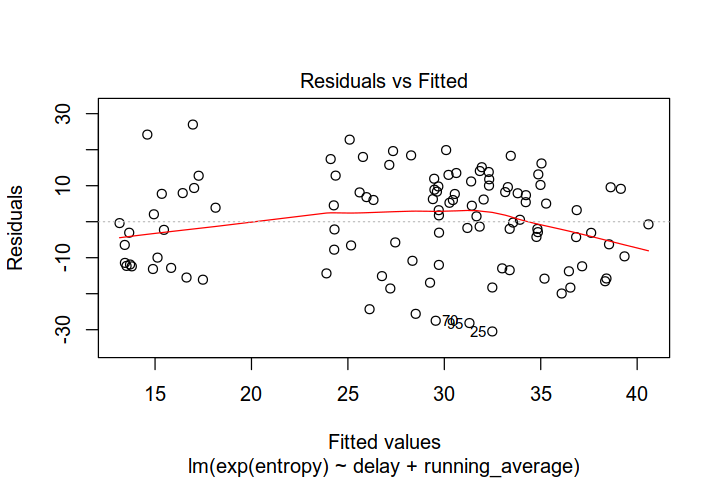

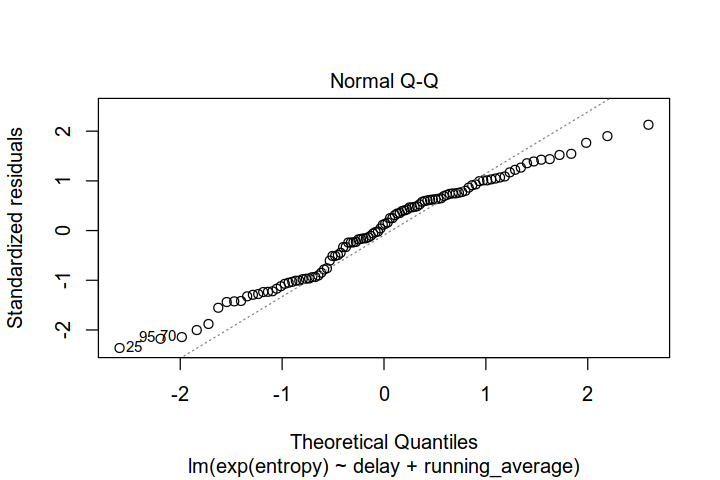

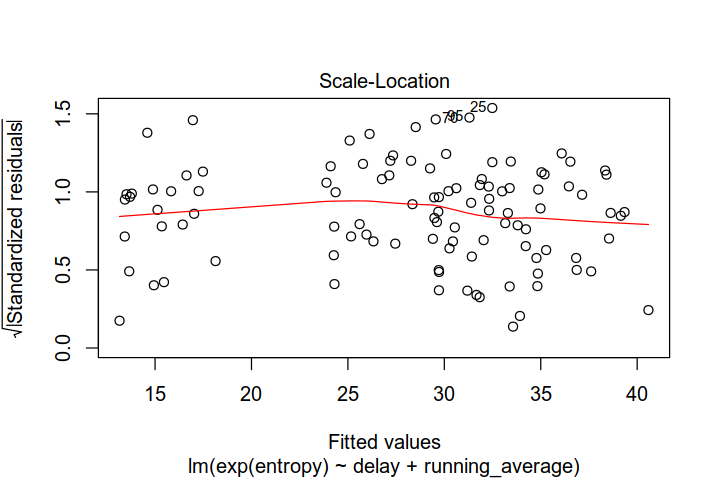

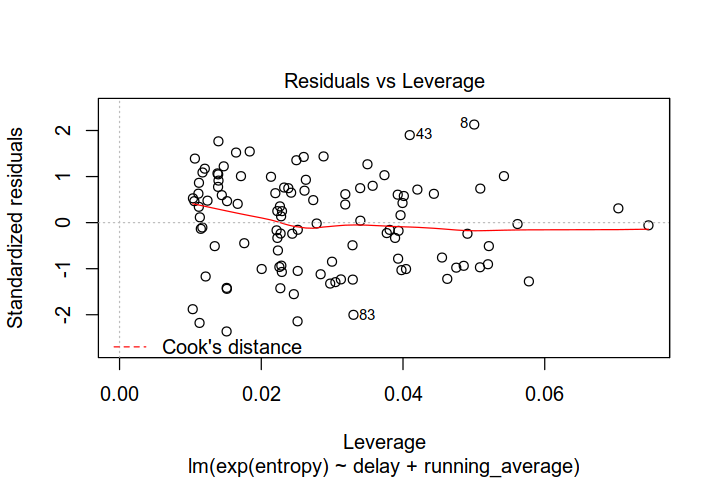

In [56]:
#exp(entropy) vs all 
lm_chur_multi_entropy <- lm(exp(entropy) ~ delay+ running_average, data = model_entropy_concentration_chur)
summary(lm_chur_multi_entropy)
confint(lm_chur_multi_entropy )

lm_geneve_multi_entropy <- lm(exp(entropy) ~ delay+running_average, data = model_entropy_concentration_geneve)
summary(lm_geneve_multi_entropy )
confint(lm_geneve_multi_entropy )

lm_laupen_multi_entropy <- lm(exp(entropy) ~ delay + running_average, data = model_entropy_concentration_laupen)
summary(lm_laupen_multi_entropy)
confint(lm_laupen_multi_entropy)

lm_zurich_multi_entropy <- lm(exp(entropy) ~ delay + running_average, data = model_entropy_concentration_zurich)
summary(lm_zurich_multi_entropy)
confint(lm_zurich_multi_entropy)

lm_altenrhein_multi_entropy <- lm(exp(entropy) ~ delay + running_average, data = model_entropy_concentration_altenrhein)
summary(lm_altenrhein_multi_entropy)
confint(lm_altenrhein_multi_entropy)

lm_lugano_multi_entropy <- lm(exp(entropy) ~ delay + running_average, data = model_entropy_concentration_lugano)
summary(lm_lugano_multi_entropy)
confint(lm_lugano_multi_entropy)

plot(lm_chur_multi_entropy)

In [57]:
#plot the diagnostic plots for Chur
residuals_fitted_mult <- autoplot(lm_chur_multi_entropy, which =1) + theme(
    plot.title = element_text(size = number),
    axis.title.x = element_text(size = number),  
    axis.title.y = element_text(size = number),  
    axis.text.x = element_text(size = number),   
    axis.text.y = element_text(size = number),
  )

qq_plot_mult <- autoplot(lm_chur_multi_entropy, which =2) + theme(
    plot.title = element_text(size = number),
   axis.title.x = element_text(size = number),  
    axis.title.y = element_text(size = number), 
    axis.text.x = element_text(size = number),  
    axis.text.y = element_text(size = number)    
  )

cairo_ps(file = "FinalReport/figures/multi_diagnostic.eps", width=12, height = 6)

#combine them in one plot 
multi_diagnostic <- residuals_fitted_mult + qq_plot_mult
print(multi_diagnostic)

dev.off()

png 
  2


Call:
lm(formula = coverage ~ delay + running_average, data = model_coverage_100_concentration_chur)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.79788 -0.09451  0.06126  0.13231  0.47442 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)      1.134e+00  8.974e-02  12.638  < 2e-16 ***
delay           -1.166e-01  1.770e-02  -6.587 1.93e-09 ***
running_average  6.638e-05  7.383e-05   0.899    0.371    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.2473 on 103 degrees of freedom
Multiple R-squared:  0.3031,	Adjusted R-squared:  0.2896 
F-statistic:  22.4 on 2 and 103 DF,  p-value: 8.367e-09


,2.5 %,97.5 %
(Intercept),9.562135e-01,1.3121849000
delay,-1.516668e-01,-0.0814754429
running_average,-8.005597e-05,0.0002128119



Call:
lm(formula = coverage ~ delay + running_average, data = model_coverage_100_concentration_geneve)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.80318 -0.03775  0.06495  0.13821  0.24670 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)      8.656e-01  6.654e-02  13.009   <2e-16 ***
delay           -3.368e-02  1.789e-02  -1.882   0.0623 .  
running_average  1.091e-04  5.049e-05   2.160   0.0328 *  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.2159 on 114 degrees of freedom
Multiple R-squared:  0.06792,	Adjusted R-squared:  0.05157 
F-statistic: 4.154 on 2 and 114 DF,  p-value: 0.01814


,2.5 %,97.5 %
(Intercept),7.338073e-01,0.997432207
delay,-6.913012e-02,0.001764325
running_average,9.062438e-06,0.000209092



Call:
lm(formula = coverage ~ delay + running_average, data = model_coverage_100_concentration_laupen)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.81968  0.00371  0.11858  0.16972  0.29480 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)      9.309e-01  9.087e-02  10.244   <2e-16 ***
delay           -4.114e-02  2.084e-02  -1.974    0.051 .  
running_average -3.212e-05  1.388e-04  -0.231    0.817    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.2907 on 103 degrees of freedom
Multiple R-squared:  0.03652,	Adjusted R-squared:  0.01781 
F-statistic: 1.952 on 2 and 103 DF,  p-value: 0.1472


,2.5 %,97.5 %
(Intercept),0.7506554872,1.1110741036
delay,-0.0824691386,0.0001907965
running_average,-0.0003073194,0.0002430750



Call:
lm(formula = coverage ~ delay + running_average, data = model_coverage_100_concentration_zurich)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.78407 -0.01014  0.03275  0.05397  0.09537 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)      9.417e-01  3.752e-02  25.097   <2e-16 ***
delay           -2.879e-03  8.828e-03  -0.326    0.745    
running_average -4.391e-05  3.485e-05  -1.260    0.210    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.1103 on 125 degrees of freedom
Multiple R-squared:  0.0134,	Adjusted R-squared:  -0.002381 
F-statistic: 0.8492 on 2 and 125 DF,  p-value: 0.4302


,2.5 %,97.5 %
(Intercept),0.8674203977,1.015943e+00
delay,-0.0203502109,1.459201e-02
running_average,-0.0001128771,2.506332e-05



Call:
lm(formula = coverage ~ delay + running_average, data = model_coverage_100_concentration_altenrhein)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.82530  0.00876  0.08095  0.11242  0.16674 

Coefficients:
                 Estimate Std. Error t value Pr(>|t|)    
(Intercept)     7.864e-01  8.800e-02   8.937  1.7e-14 ***
delay           1.285e-02  1.558e-02   0.825    0.411    
running_average 4.277e-07  1.040e-04   0.004    0.997    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.218 on 103 degrees of freedom
Multiple R-squared:  0.006563,	Adjusted R-squared:  -0.01273 
F-statistic: 0.3402 on 2 and 103 DF,  p-value: 0.7124


,2.5 %,97.5 %
(Intercept),0.6118813412,0.9609235401
delay,-0.0180492802,0.0437541748
running_average,-0.0002058339,0.0002066893



Call:
lm(formula = coverage ~ delay + running_average, data = model_coverage_100_concentration_lugano)

Residuals:
    Min      1Q  Median      3Q     Max 
-0.7462 -0.4364  0.2019  0.3028  0.5363 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)   
(Intercept)      0.4248646  0.1502041   2.829  0.00561 **
delay           -0.0082949  0.0338608  -0.245  0.80696   
running_average  0.0004301  0.0002086   2.062  0.04170 * 
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.3814 on 104 degrees of freedom
Multiple R-squared:  0.04007,	Adjusted R-squared:  0.02161 
F-statistic: 2.171 on 2 and 104 DF,  p-value: 0.1193


,2.5 %,97.5 %
(Intercept),1.270043e-01,0.7227248562
delay,-7.544217e-02,0.0588523893
running_average,1.646216e-05,0.0008436484


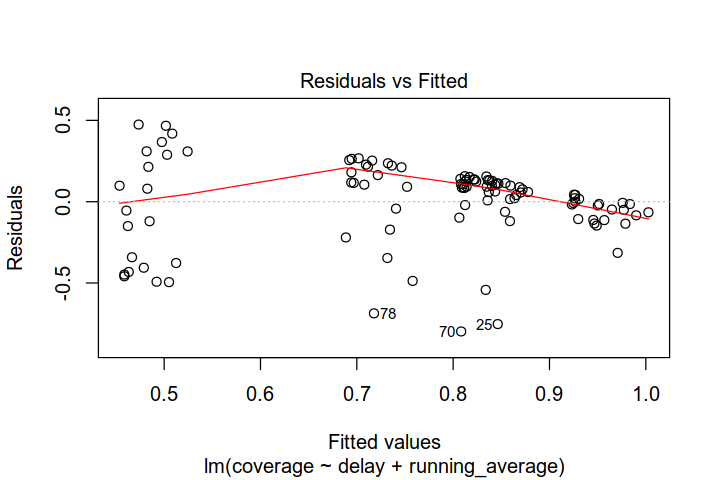

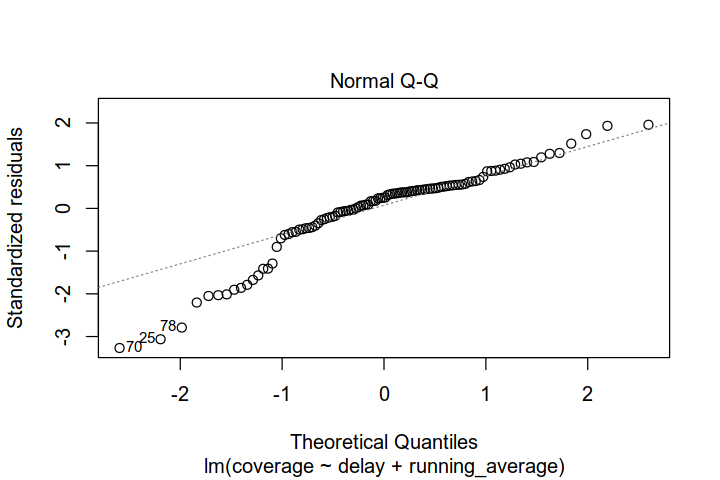

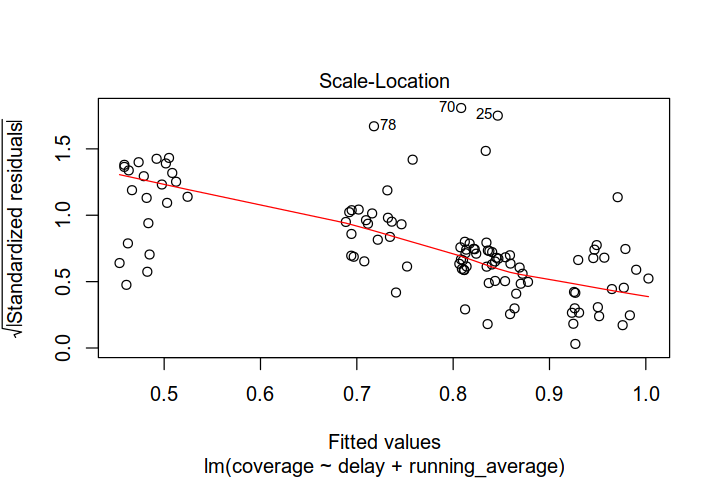

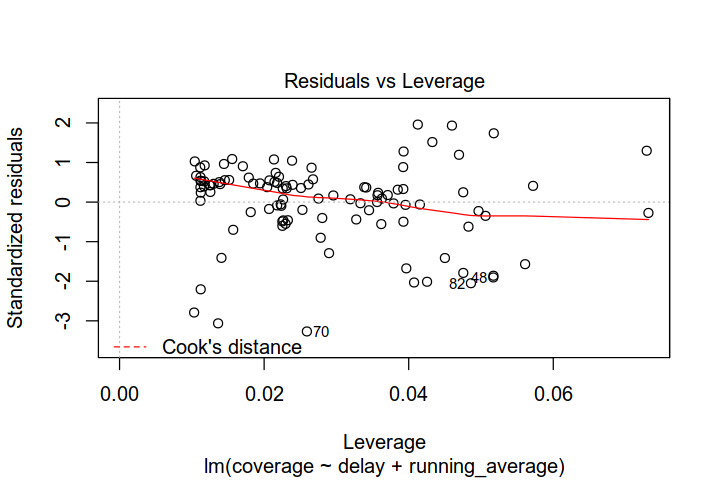

In [58]:
#models with coverage threshold 100 vs all
lm_chur_multi_coverage <- lm(coverage ~ delay+ running_average, data = model_coverage_100_concentration_chur)
summary(lm_chur_multi_coverage)
confint(lm_chur_multi_coverage )

lm_geneve_multi_coverage <- lm(coverage ~ delay+running_average, data = model_coverage_100_concentration_geneve)
summary(lm_geneve_multi_coverage )
confint(lm_geneve_multi_coverage )

lm_laupen_multi_coverage <- lm(coverage ~ delay + running_average, data = model_coverage_100_concentration_laupen)
summary(lm_laupen_multi_coverage)
confint(lm_laupen_multi_coverage)

lm_zurich_multi_coverage <- lm(coverage ~ delay + running_average, data = model_coverage_100_concentration_zurich)
summary(lm_zurich_multi_coverage)
confint(lm_zurich_multi_coverage)

lm_altenrhein_multi_coverage <- lm(coverage ~ delay + running_average, data = model_coverage_100_concentration_altenrhein)
summary(lm_altenrhein_multi_coverage)
confint(lm_altenrhein_multi_coverage)

lm_lugano_multi_coverage <- lm(coverage ~ delay + running_average, data = model_coverage_100_concentration_lugano)
summary(lm_lugano_multi_coverage)
confint(lm_lugano_multi_coverage)

plot(lm_chur_multi_coverage)